<a href="https://colab.research.google.com/github/LaZzyMan/Notebook/blob/master/model_explain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [48]:
import shap
import pandas as pd
import os
import pickle
import numpy as np
from tqdm import tqdm
from matplotlib import cm
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import datetime
import stellargraph as sg
import xgboost as xgb

from xgboost import plot_importance
from xgboost.sklearn import XGBClassifier
from sklearn import model_selection
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.model_selection import ParameterGrid, GridSearchCV
from sklearn.model_selection import train_test_split

In [ ]:
!pip install shap geopandas stellargraph

In [ ]:
!pip install --upgrade matplotlib

In [ ]:
graph_traffic, graph_spatial, graph_ts = pickle.load(open('/content/drive/My Drive/Data/graphs/sg_graphs_undirected_20151201_land_cover_poi_building_50_1000.pickle', 'rb'))
labels = pickle.load(open('/content/drive/My Drive/Data/label.pickle', 'rb'))
exclude_node = ['32715', '32955', '37779', '37812', '37831', '38504', '39172', '39675', '39981', '39043']
for node in exclude_node:
  labels.pop(node)
num_nodes = len(labels)
X = []
Y = []
for node, label in labels.items():
    X.append(node)
    Y.append(label)
labels = pd.Series(Y, index=X)
gdf = pickle.load(open('/content/drive/My Drive/Data/land_use_unit_display.pickle', 'rb'))
gdf = gdf.drop([int(node) for node in exclude_node])
graphs = [graph_traffic, graph_spatial, graph_ts]

In [ ]:
feature_names = ['rice_paddy', 'other_cropland', 'orchard', 'bare_farmland', 'broadleaf_leaf_on', 'broadleaf_leaf_off', 'needleleaf_leaf_off',
          'mixedleaf_leaf_off', 'natural_grassland', 'grassland_leaf_off', 'shrubland_leaf_on', 'shrubland_leaf_off', 'marshland', 
          'mudlaf', 'water', 'herbaceons tundra', 'impervious_surface','bareland', 'land_cover_mix_index', 'shopping_service', 
          'catering_service', 'domestic_service', 'transportation_facilities_service', 'corporate', 'business_residence', 
          'science_and_education_service', 'access_facilities', 'government_agencies_and_social_organizations', 'financial_insurance_service',
          'accommodation_service', 'healthcare_service', 'vehicle_service', 'sport_and_leisure_service', 'public_utilities', 
          'famous_tourist_sites', 'poi_mix_index', 'building_PLAND', 'building_LSI', 'floor_mean', 'floor_std']
X = {}
features = graph_traffic.node_features()
# features = features / features.max(axis=0)
nodes = list(graph_traffic.nodes())
for idx, feature_name in enumerate(feature_names):
  X[feature_name] = features[:, idx]
X = pd.DataFrame(X, index=nodes)
classes = ['C', 'G', 'M', 'P', 'R', 'U']

# 特征分类及解释

不使用网络信息，只通过节点自身40维特征向量进行分类并进行解释

In [ ]:
# 数据分割
tr_farc = .8
# val_frac = .5
train_set, test_set = model_selection.train_test_split(labels, train_size=int(num_nodes * tr_farc), test_size=None, stratify=labels)
# val_set, test_set = model_selection.train_test_split(test_set, train_size=int(num_nodes * val_frac), test_size=None, stratify=test_set)
encoding = LabelEncoder()
Y = encoding.fit_transform(labels)
train_Y = encoding.transform(train_set)
# val_Y = encoding.transform(val_set)
test_Y = encoding.transform(test_set)
train_X = X.loc[list(train_set.index)]
# val_X = X.loc[list(val_set.index)]
test_X = X.loc[list(test_set.index)]
X = X.loc[list(labels.index)]

In [ ]:
X

,rice_paddy,other_cropland,orchard,bare_farmland,broadleaf_leaf_on,broadleaf_leaf_off,needleleaf_leaf_off,mixedleaf_leaf_off,natural_grassland,grassland_leaf_off,shrubland_leaf_on,shrubland_leaf_off,marshland,mudlaf,water,herbaceons tundra,impervious_surface,bareland,land_cover_mix_index,shopping_service,catering_service,domestic_service,transportation_facilities_service,corporate,business_residence,science_and_education_service,access_facilities,government_agencies_and_social_organizations,financial_insurance_service,accommodation_service,healthcare_service,vehicle_service,sport_and_leisure_service,public_utilities,famous_tourist_sites,poi_mix_index,building_PLAND,building_LSI,floor_mean,floor_std
37146,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,0.062500,0.140625,0.140625,0.000000,0.265625,0.062500,0.093750,0.062500,0.000000,0.156250,0.062500,0.000000,0.015625,0.000000,0.000000,0.000000,0.800483,0.000000,0.000000,0.000000,0.000000
37147,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,0.079801,0.098753,0.127182,0.032419,0.259352,0.034913,0.094763,0.007481,0.017456,0.236908,0.000000,0.027169,0.009975,0.014963,0.012469,0.009975,0.808947,0.035010,0.030719,0.042289,0.000000
101,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,0.204545,0.368182,0.136364,0.136364,0.000000,0.045455,0.022727,0.090909,0.000000,0.000000,0.000000,0.165072,0.022727,0.000000,0.090909,0.000000,0.794505,0.109527,0.034384,0.124798,0.017323
154,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,0.142857,0.446617,0.187970,0.082707,0.000000,0.067669,0.007519,0.030075,0.030075,0.015038,0.105263,0.136526,0.000000,0.007519,0.022556,0.015038,0.833127,0.079176,0.035189,0.305502,0.297559
11828,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,0.313433,0.214925,0.071642,0.062687,0.077612,0.032836,0.056716,0.035821,0.029851,0.017910,0.110448,0.086724,0.005970,0.023881,0.011940,0.005970,0.872151,0.057848,0.040879,0.112999,0.056845
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37067,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,0.100000,0.180000,0.100000,0.000000,0.000000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.363158,0.000000,0.200000,0.000000,0.000000,0.614291,0.085287,0.027537,0.021145,0.000000
17711,0.265027,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.384853,0.0,0.756172,0.0,0.306371,0.067797,0.305085,0.056497,0.056497,0.107345,0.090395,0.033898,0.062147,0.011299,0.022599,0.271186,0.041035,0.005650,0.033898,0.000000,0.000000,0.853827,0.062770,0.023091,0.528617,0.000000
613,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0366,0.000000,0.0,0.0,0.0,0.0,0.0,0.245461,0.0,0.857536,0.0,0.210458,0.000000,0.000000,0.250000,0.500000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.396841,0.099107,0.082435,0.527236,0.456657
25505,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000216,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.999873,0.0,0.000565,0.085106,0.191489,0.148936,0.063830,0.074468,0.085106,0.106383,0.138298,0.010638,0.053191,0.010638,0.115901,0.021277,0.042553,0.021277,0.000000,0.947798,0.096287,0.187228,0.184338,0.109034


In [ ]:
# 网格搜索调参
param_grid = {
 'learning_rate':[0.01, 0.007, 0.005, 0.003, 0.001]
}
model = xgb.XGBClassifier(
    max_depth=5,
    learning_rate=0.003,
    min_child_weight=1,
    gamma=0.5,
    subsample=0.7,
    colsample_bytree=0.9,
    num_class=6,
    n_estimators=800,
    scale_pos_weight=1,
    reg_lambda=0.01,
    reg_alpha=0.1,
    silent=1,
    objective='multi:softprob')
cv = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='f1_micro',
    n_jobs=-1,
    verbose=1
)
cv.fit(train_X, train_Y, verbose=True)
pd.DataFrame(cv.cv_results_)

In [ ]:
model = xgb.XGBClassifier(
    max_depth=5,
    learning_rate=0.003,
    min_child_weight=1,
    gamma=0.5,
    subsample=0.7,
    colsample_bytree=0.9,
    num_class=6,
    n_estimators=800,
    scale_pos_weight=1,
    reg_lambda=0.01,
    reg_alpha=0.1,
    silent=False,
    objective='multi:softprob')
model.fit(train_X, train_Y, eval_set=[(test_X, test_Y)], eval_metric='merror', verbose=True)

In [ ]:
prob_Y = model.predict_proba(test_X)
pred_Y = model.predict(test_X)

In [ ]:
print('F1_micro:%f%%'%(f1_score(test_Y,pred_Y, average='micro') * 100))
print('F1_macro:%f%%'%(f1_score(test_Y,pred_Y, average='macro') * 100))
print('accuracy:%f%%'%(accuracy_score(test_Y,pred_Y) * 100))

F1_micro:63.036304%
F1_macro:56.918609%
accuracy:63.036304%


In [ ]:
single_result = classification_report(test_Y, pred_Y, target_names=encoding.classes_, output_dict=True)
pd.DataFrame.from_dict(single_result)

,C,G,M,P,R,U,accuracy,macro avg,weighted avg
precision,0.538462,0.812500,0.583333,0.452381,0.777778,0.571429,0.630363,0.622647,0.632422
recall,0.708861,0.590909,0.200000,0.413043,0.831683,0.600000,0.630363,0.557416,0.630363
f1-score,0.612022,0.684211,0.297872,0.431818,0.803828,0.585366,0.630363,0.569186,0.615794
support,79.000000,22.000000,35.000000,46.000000,101.000000,20.000000,0.630363,303.000000,303.000000


XGBoost特征重要性

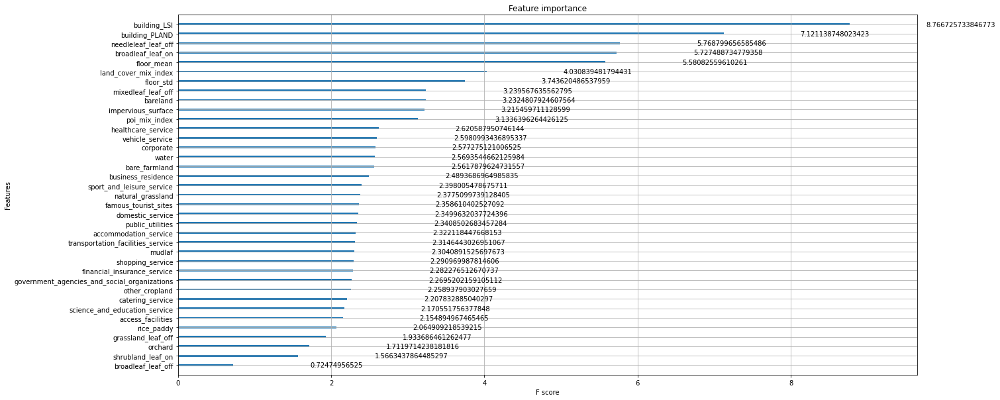

In [ ]:
_, ax = plt.subplots(figsize=(20, 10))
plot_importance(model, ax, importance_type='gain')

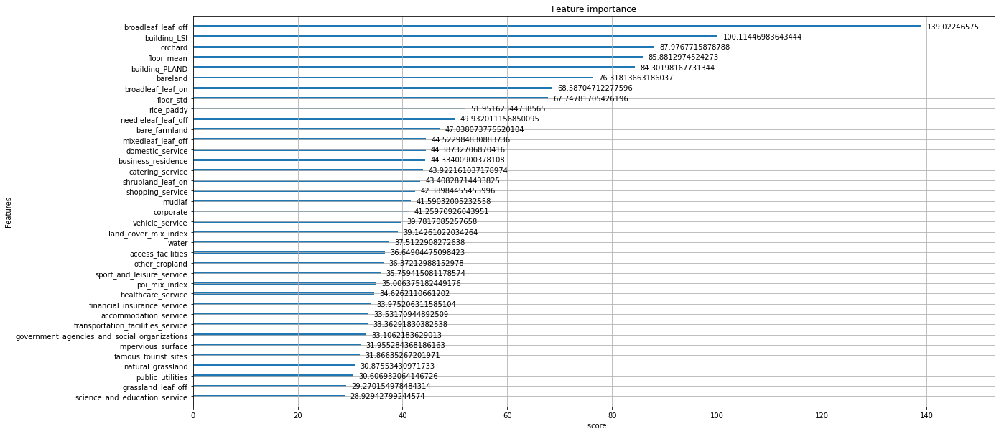

In [ ]:
_, ax = plt.subplots(figsize=(20, 10))
plot_importance(model, ax, importance_type='cover')

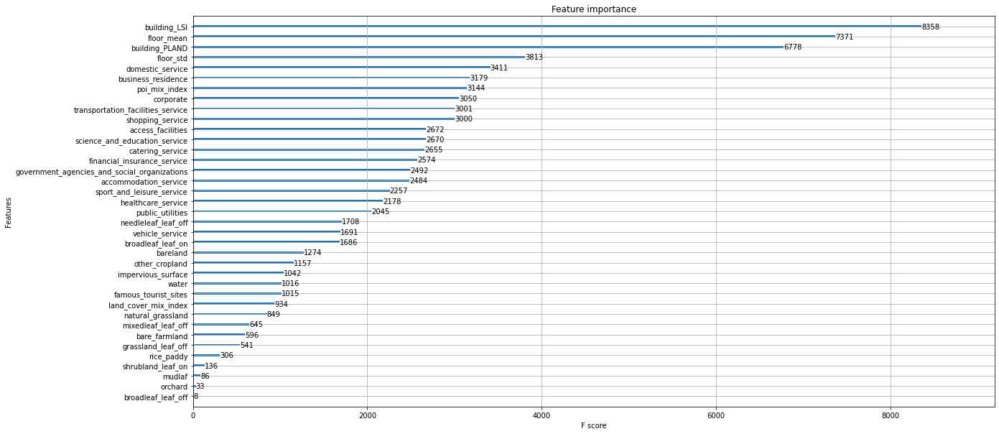

In [ ]:
_, ax = plt.subplots(figsize=(20, 10))
plot_importance(model, ax, importance_type='weight')

SHAP特征解释

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_X)  # 6*N*F

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0, :], train_X.iloc[0, :])

商业服务业用地：较低的建筑形态指数；较高的建筑面积比例；较高的建筑高度标准差；较多的运动娱乐poi；较低的植被覆盖（灌木、湿地、阔叶林等）和较高的不透水面覆盖；

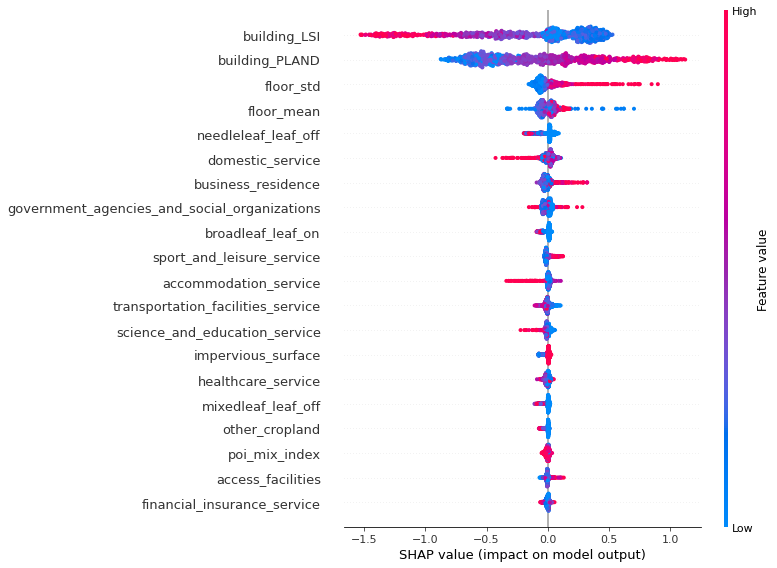

In [ ]:
shap.initjs()
shap.summary_plot(shap_values[0], train_X)
# shap.summary_plot(shap_values[0], train_X, plot_type="bar")

绿地与广场：低建筑覆盖面积；大量的植被覆盖和低不透水面；低建筑形态指数；低建筑平均高度；较多的购物服务poi和较少的商业住宅；

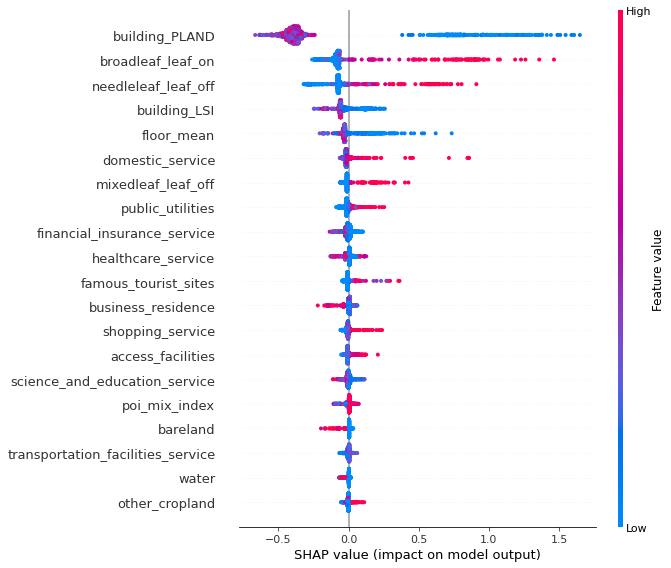

In [ ]:
shap.initjs()
shap.summary_plot(shap_values[1], train_X)
# shap.summary_plot(shap_values[1], train_X, plot_type="bar")

工业用地：低建筑高度标准差和建筑平均高度；大量的公司企业poi和落地覆盖；较多的汽车服务poi；

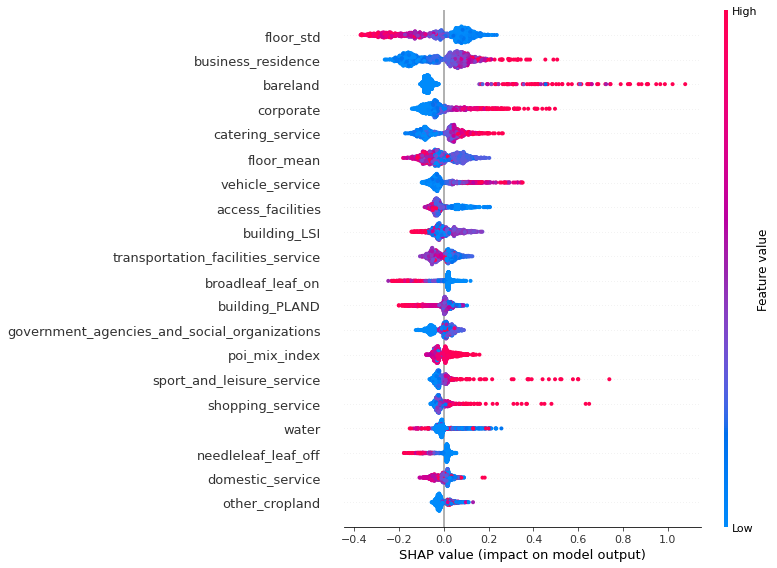

In [ ]:
shap.initjs()
shap.summary_plot(shap_values[2], train_X)
# shap.summary_plot(shap_values[2], train_X, plot_type="bar")

公共管理与服务用地：较低的建筑形态指数、建筑高度和建筑覆盖面积；较多的医疗服务和科教文化服务poi；较少的商业住宅和购物服务poi；

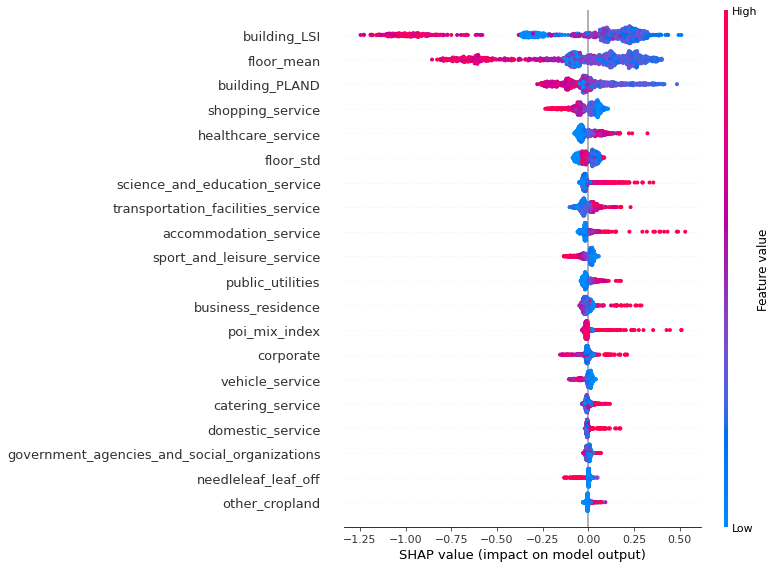

In [ ]:
shap.initjs()
shap.summary_plot(shap_values[3], train_X)
# shap.summary_plot(shap_values[3], train_X, plot_type="bar")

居住用地：高建筑形态指数；高平均建筑高度；低建筑覆盖面积和建筑高度差异；较多的购物服务，通行设施，住宿服务等poi

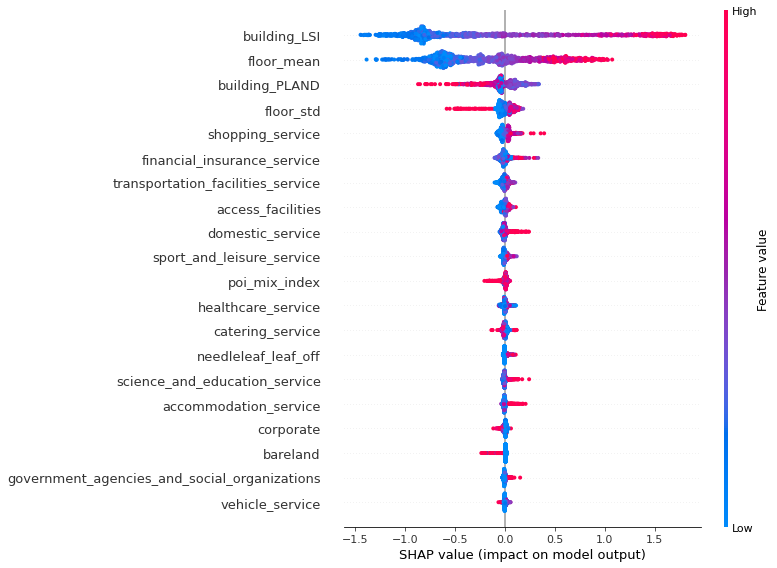

In [ ]:
shap.initjs()
shap.summary_plot(shap_values[4], train_X)
# shap.summary_plot(shap_values[4], train_X, plot_type="bar")

市政公共设施用地：低建筑高度和标准差；低POI混合度和地表覆盖混合度（由于面积小，多为公交站等设施区域）；低建筑形态指数；

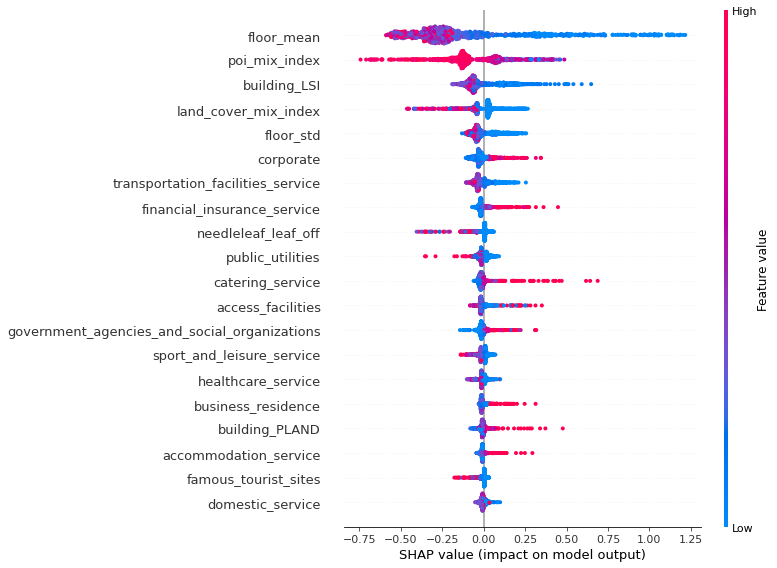

In [ ]:
shap.initjs()
shap.summary_plot(shap_values[5], train_X)
# shap.summary_plot(shap_values[5], train_X, plot_type="bar")

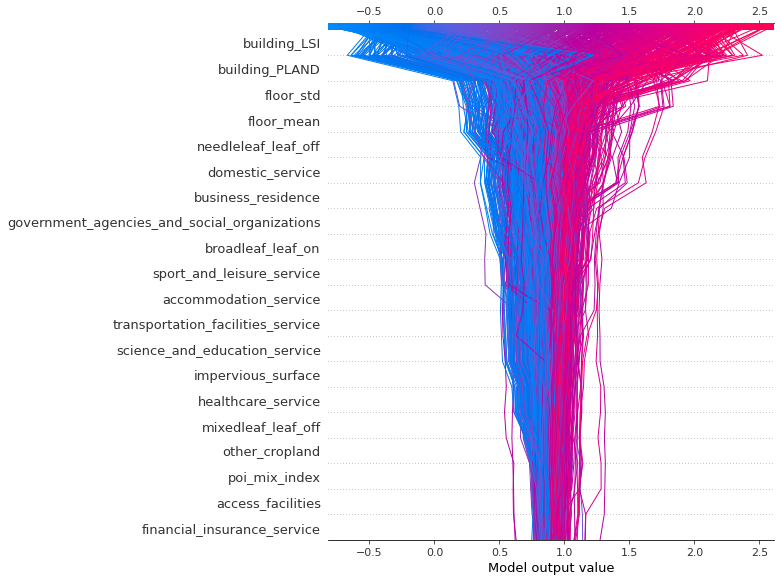

In [ ]:
shap.decision_plot(explainer.expected_value[0], shap_values[0], train_X)

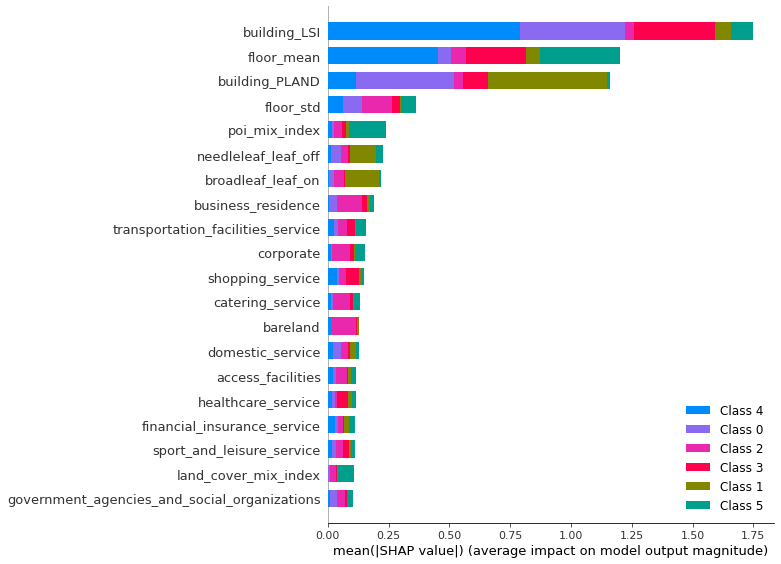

In [ ]:
shap.summary_plot(shap_values=shap_values, features=X.columns, plot_type='bar')

# Integrated Gradient GNN模型解释

In [ ]:
model_integrated_gradients = pickle.load(open('/content/drive/My Drive/Data/export/node_masks_raw.pickle', 'rb'))
all_targets = model_integrated_gradients['all_targets']
y_pred = model_integrated_gradients['y_pred']
feature_igs = np.array(model_integrated_gradients['node_masks']).sum(0)
node_igs = np.array(model_integrated_gradients['node_masks']).sum(-1)
self_igs = np.array(model_integrated_gradients['node_masks'])[list(range(num_nodes)), :, list(range(num_nodes)), :].transpose(1, 0, 2)
feature_igs = feature_igs - self_igs
link_integrated_gradients = pickle.load(open('/content/drive/My Drive/Data/export/link_integrated_gradients_raw.pickle', 'rb'))
link_igs = link_integrated_gradients['line_igs']
full_link_masks = link_integrated_gradients['full_link_masks']

In [63]:
node_idx = graphs[0].nodes()
X = X.loc[list(node_idx)]
c_pred = y_pred.argmax(axis=-1)
c_idx = [np.where(c_pred==i)[0] for i in range(6)]
c_true = [list(labels[labels==c].index) for c in classes]

# (N' x F x C)

(1) (N' x F x C) 对于节点n'，在进行分类时，对于c类的概率，该节点对其他节点的总影响力与该节点特征值的关系，即节点特征的对外辐射影响
按类别分割



# 商业与服务业用地

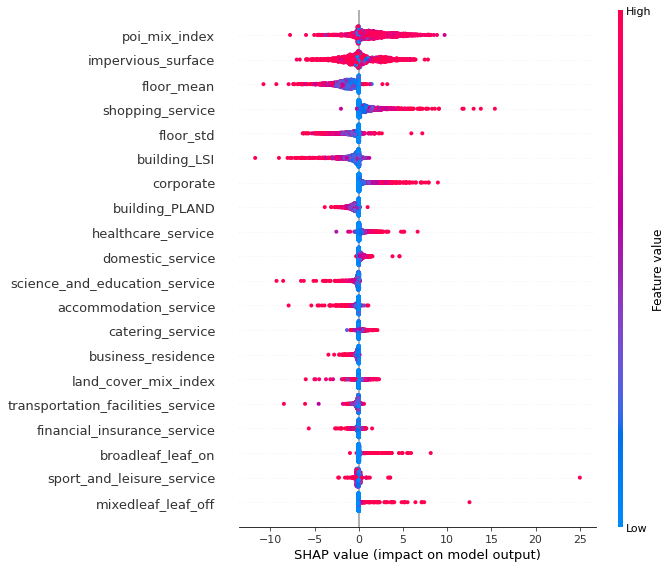

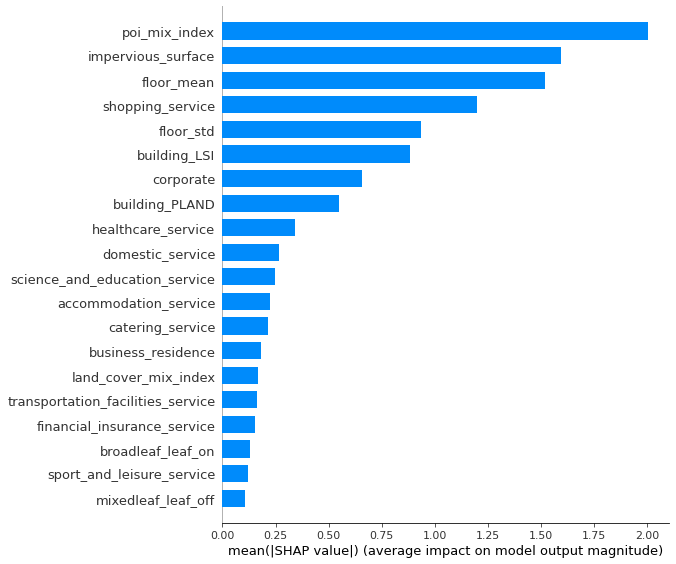

In [104]:
shap.summary_plot(feature_igs[0], X)
plt.xlabel('IG Vlaue')
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(feature_igs[0], X.columns, plot_type="bar")

按照区域进行划分展示：可以更清晰的发现，在针对商业用地的分类中，商业区、绿地的poi混合指数、不透水面辐射积极影响而

Text(0.5, 0, 'IG Vlaue for C')

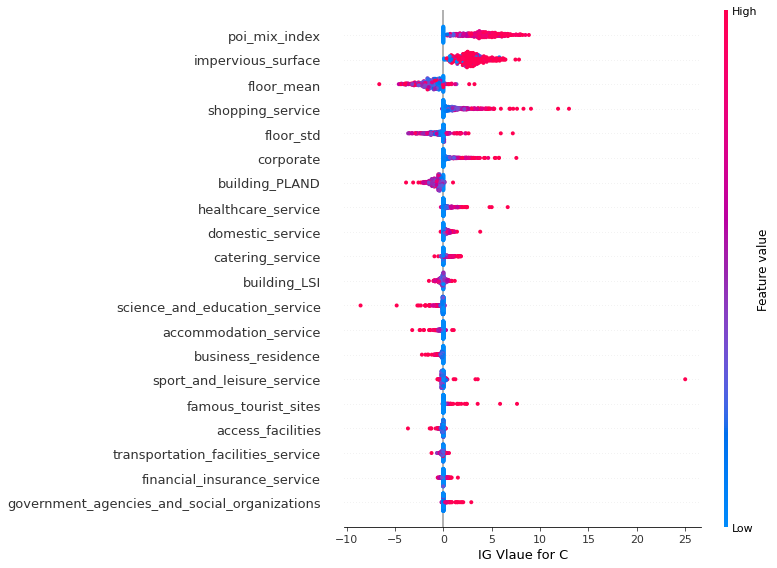

In [105]:
shap.summary_plot(feature_igs[0][np.array([list(node_idx).index(c) for c in c_true[0]])], X.loc[c_true[0]], show=False)
plt.xlabel('IG Vlaue for C')

Text(0.5, 0, 'IG Vlaue for G')

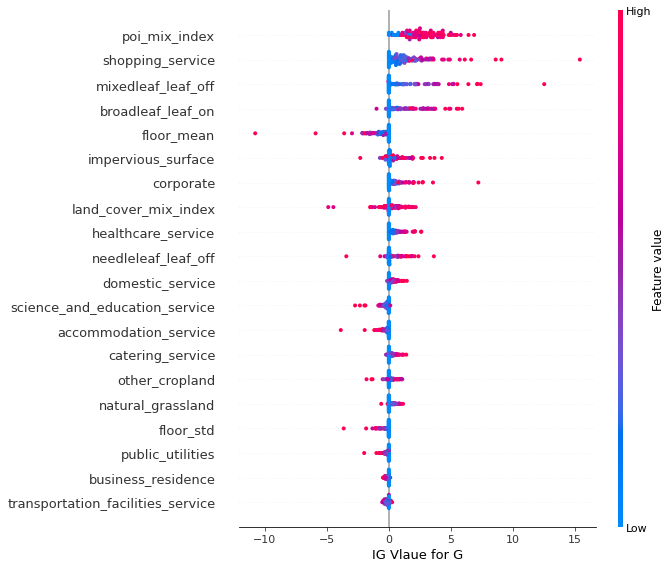

In [106]:
shap.summary_plot(feature_igs[0][np.array([list(node_idx).index(c) for c in c_true[1]])], X.loc[c_true[1]], show=False)
plt.xlabel('IG Vlaue for G')

Text(0.5, 0, 'IG Vlaue for M')

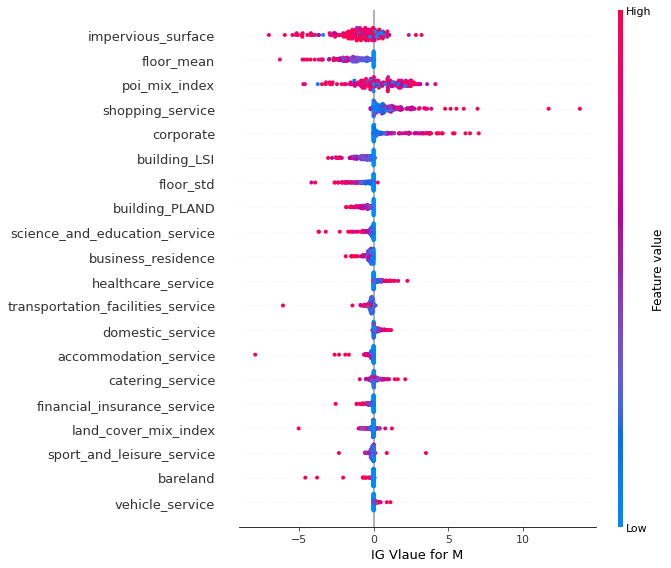

In [108]:
shap.summary_plot(feature_igs[0][np.array([list(node_idx).index(c) for c in c_true[2]])], X.loc[c_true[2]], show=False)
plt.xlabel('IG Vlaue for M')

Text(0.5, 0, 'IG Vlaue for P')

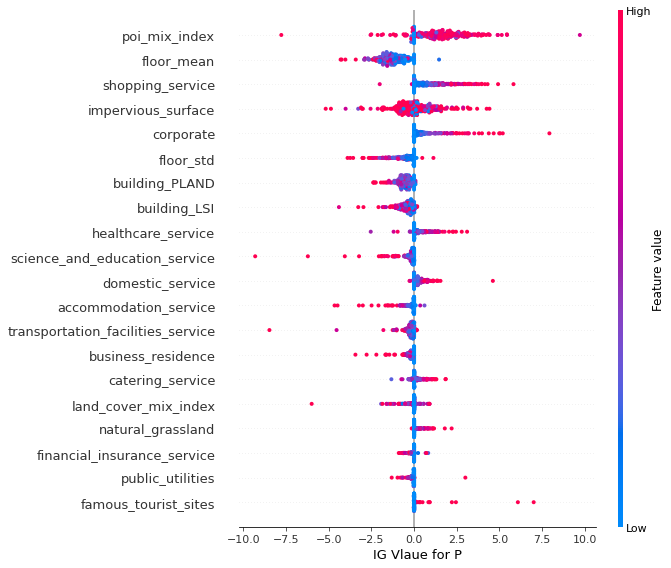

In [109]:
shap.summary_plot(feature_igs[0][np.array([list(node_idx).index(c) for c in c_true[3]])], X.loc[c_true[3]], show=False)
plt.xlabel('IG Vlaue for P')

Text(0.5, 0, 'IG Vlaue for R')

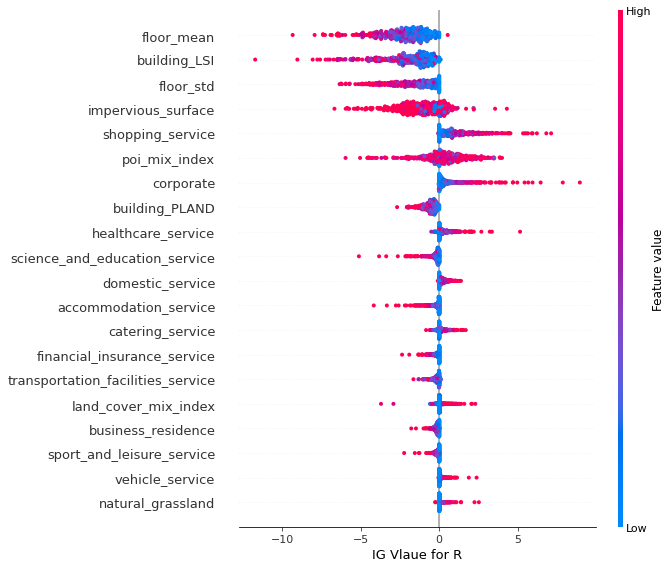

In [110]:
shap.summary_plot(feature_igs[0][np.array([list(node_idx).index(c) for c in c_true[4]])], X.loc[c_true[4]], show=False)
plt.xlabel('IG Vlaue for R')

Text(0.5, 0, 'IG Vlaue for U')

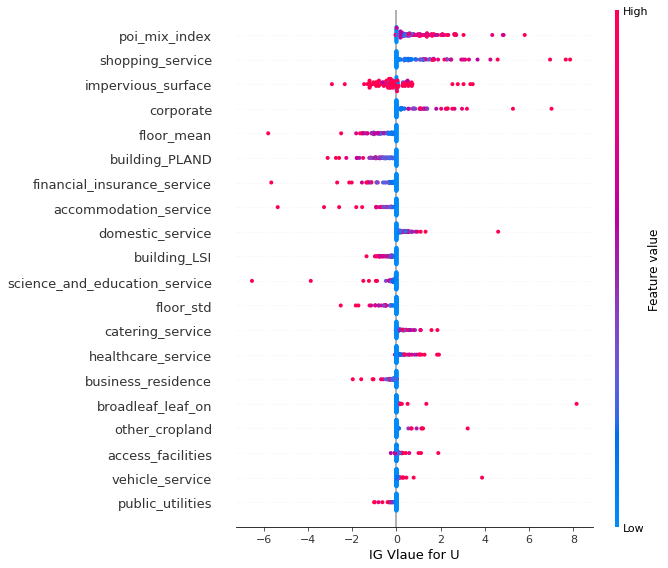

In [111]:
shap.summary_plot(feature_igs[0][np.array([list(node_idx).index(c) for c in c_true[5]])], X.loc[c_true[5]], show=False)
plt.xlabel('IG Vlaue for U')

按照特征类别进行划分展示：

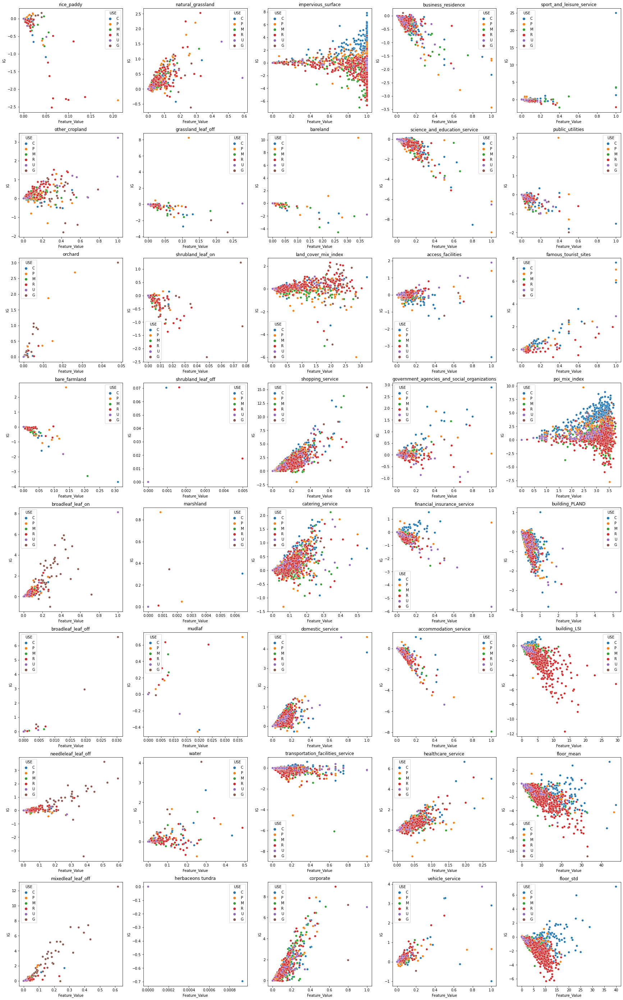

In [56]:
fig, ax = plt.subplots(8, 5, figsize=(30,50))
for i, name in enumerate(feature_names):
  display_feature_importance = {'IG': [], 'Feature_Value': [], 'USE': []}
  display_feature_importance['IG'] += list(feature_igs[0][:, i])
  display_feature_importance['Feature_Value'] += list(X[name])
  # display_feature_importance['USE'] += [classes[c] for c in c_pred]
  display_feature_importance['USE'] += list(labels.loc[list(node_idx)])
  sns.scatterplot(data=display_feature_importance, y='IG', x='Feature_Value', hue='USE', ax=ax[i % 8][i // 8])
  ax[i % 8][i // 8].set_title(name)

# 绿地与广场

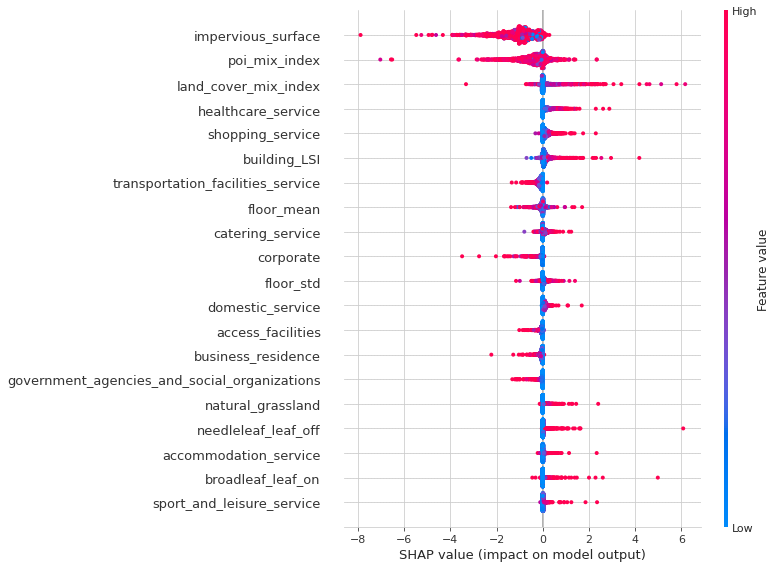

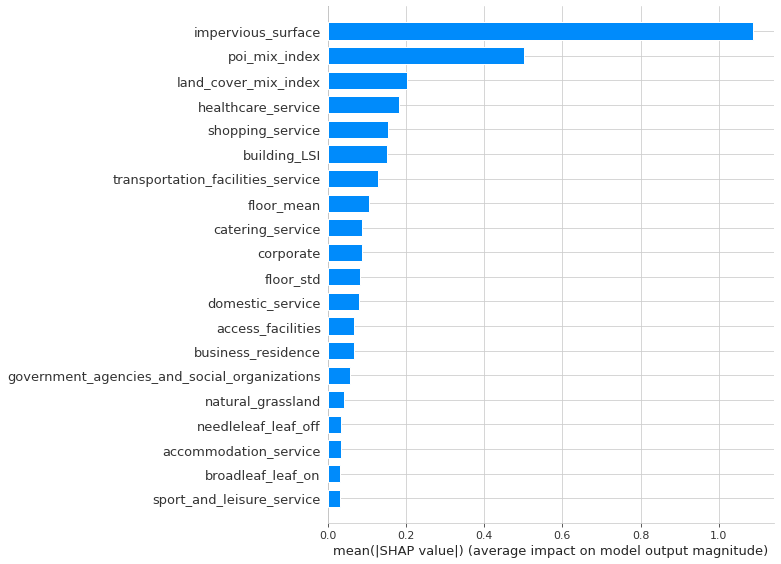

In [ ]:
shap.summary_plot(feature_igs[1], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(feature_igs[1], X.columns, plot_type="bar")

Text(0.5, 0, 'IG Vlaue for C')

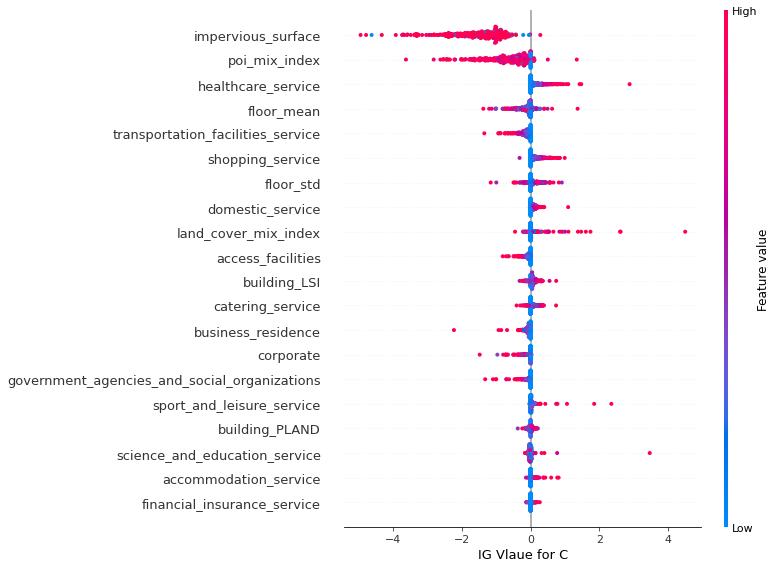

In [112]:
shap.summary_plot(feature_igs[1][np.array([list(node_idx).index(c) for c in c_true[0]])], X.loc[c_true[0]], show=False)
plt.xlabel('IG Vlaue for C')

Text(0.5, 0, 'IG Vlaue for G')

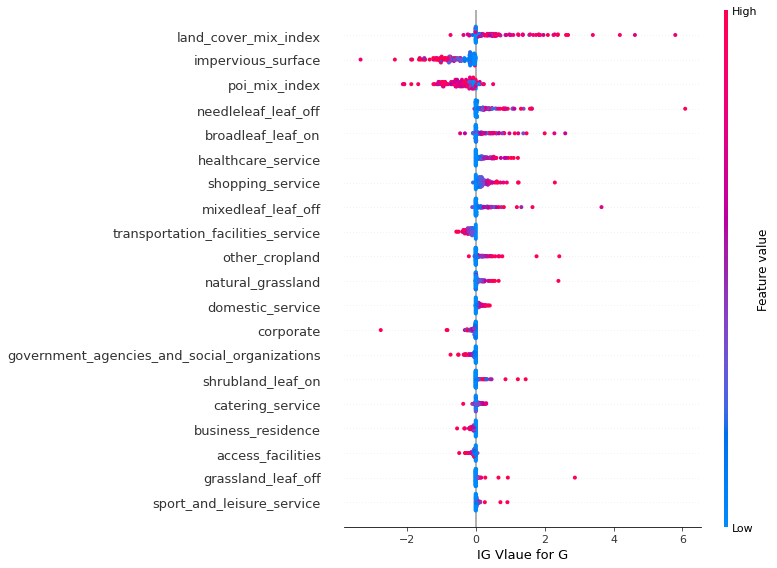

In [118]:
shap.summary_plot(feature_igs[1][np.array([list(node_idx).index(c) for c in c_true[1]])], X.loc[c_true[1]], show=False)
plt.xlabel('IG Vlaue for G')

Text(0.5, 0, 'IG Vlaue for M')

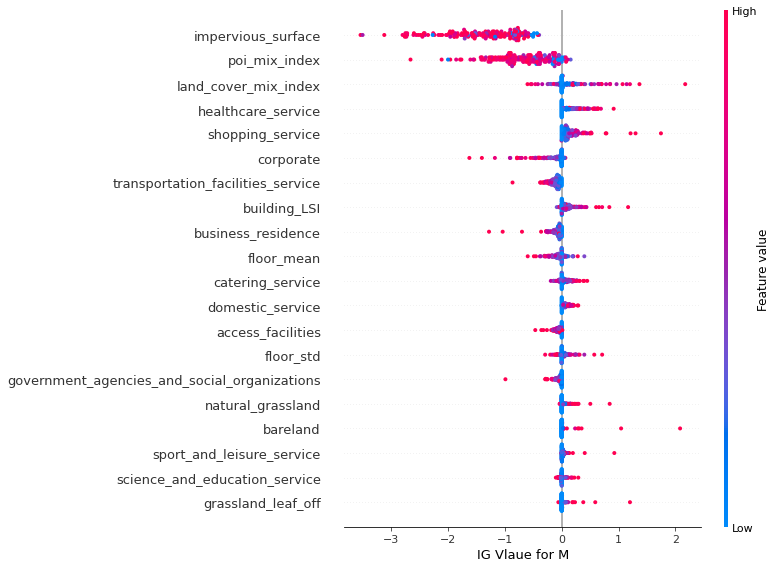

In [119]:
shap.summary_plot(feature_igs[1][np.array([list(node_idx).index(c) for c in c_true[2]])], X.loc[c_true[2]], show=False)
plt.xlabel('IG Vlaue for M')

Text(0.5, 0, 'IG Vlaue for P')

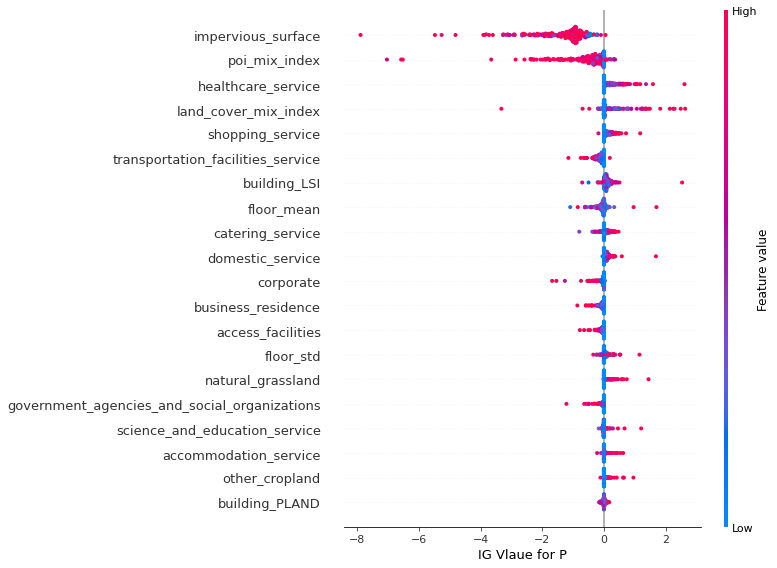

In [120]:
shap.summary_plot(feature_igs[1][np.array([list(node_idx).index(c) for c in c_true[3]])], X.loc[c_true[3]], show=False)
plt.xlabel('IG Vlaue for P')

Text(0.5, 0, 'IG Vlaue for R')

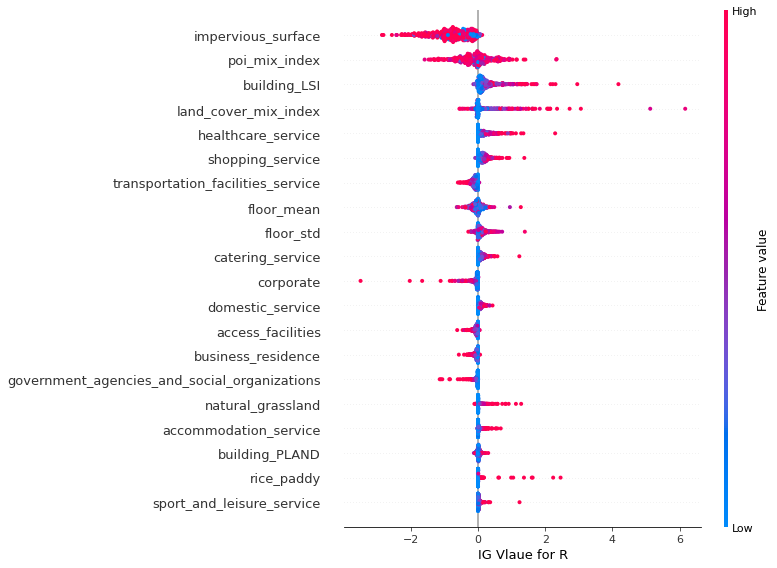

In [121]:
shap.summary_plot(feature_igs[1][np.array([list(node_idx).index(c) for c in c_true[4]])], X.loc[c_true[4]], show=False)
plt.xlabel('IG Vlaue for R')

Text(0.5, 0, 'IG Vlaue for U')

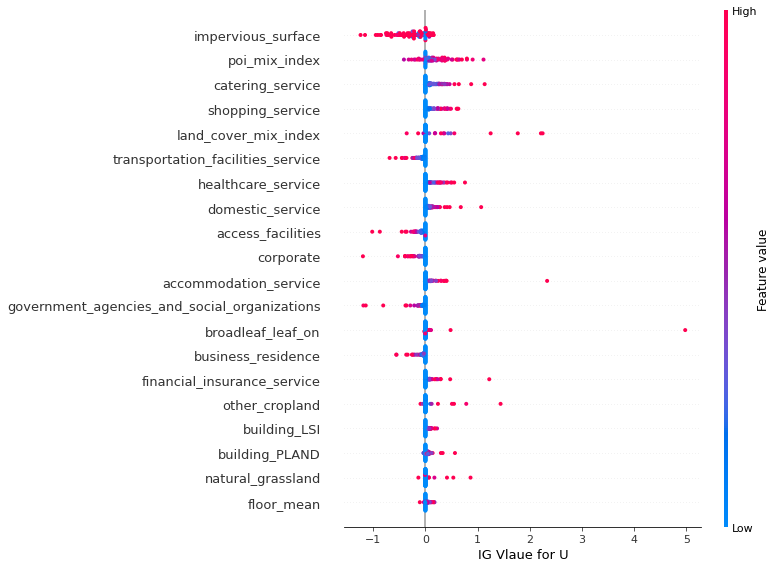

In [122]:
shap.summary_plot(feature_igs[1][np.array([list(node_idx).index(c) for c in c_true[5]])], X.loc[c_true[5]], show=False)
plt.xlabel('IG Vlaue for U')

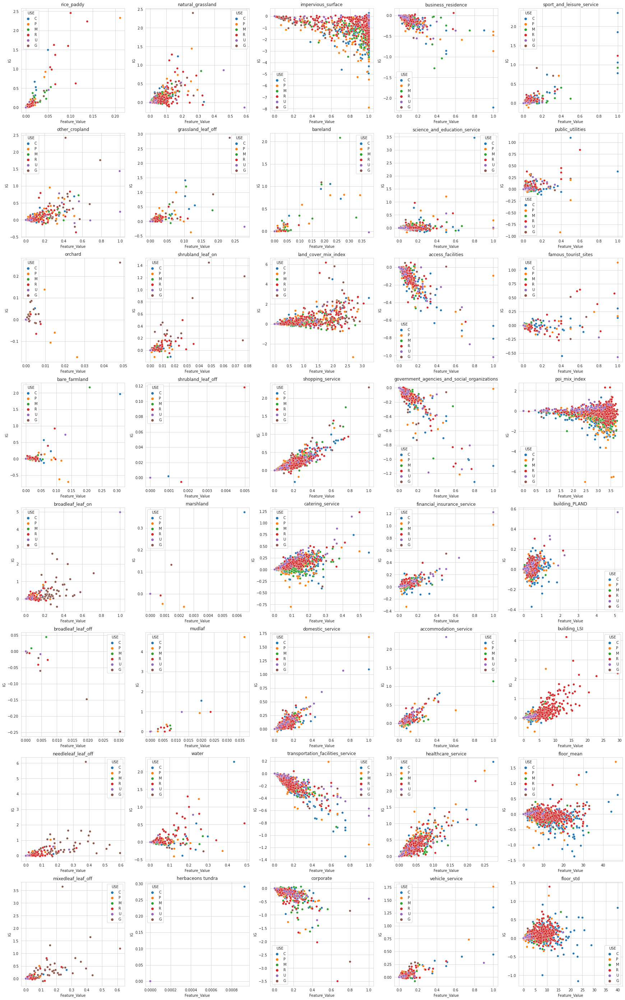

In [ ]:
fig, ax = plt.subplots(8, 5, figsize=(30,50))
for i, name in enumerate(feature_names):
  display_feature_importance = {'IG': [], 'Feature_Value': [], 'USE': []}
  display_feature_importance['IG'] += list(feature_igs[1][:, i])
  display_feature_importance['Feature_Value'] += list(X[name])
  display_feature_importance['USE'] += list(labels.loc[list(node_idx)])
  sns.scatterplot(data=display_feature_importance, y='IG', x='Feature_Value', hue='USE', ax=ax[i % 8][i // 8])
  ax[i % 8][i // 8].set_title(name)

# 工业用地

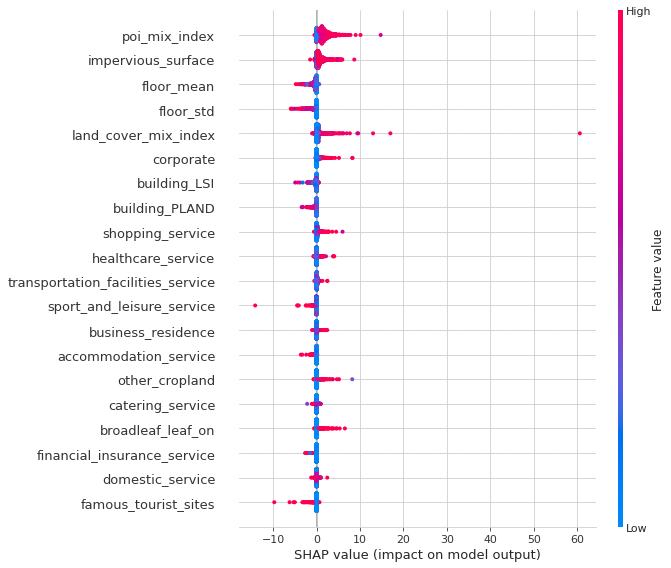

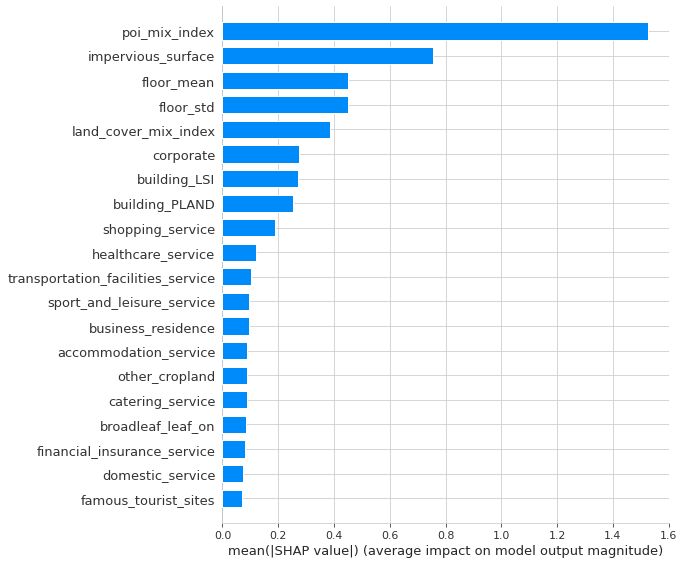

In [ ]:
shap.summary_plot(feature_igs[2], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(feature_igs[2], X.columns, plot_type="bar")

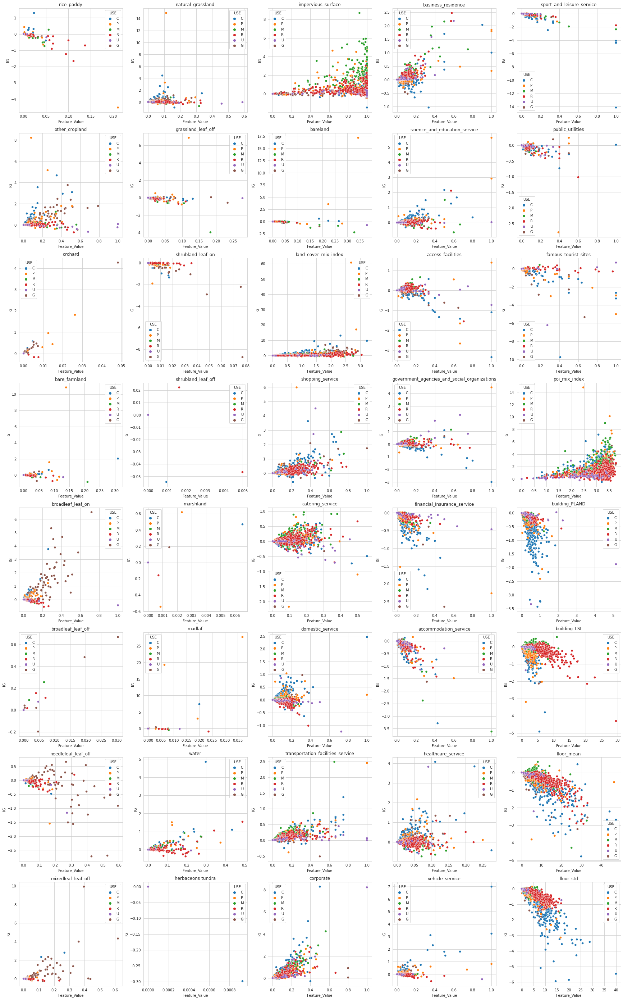

In [ ]:
fig, ax = plt.subplots(8, 5, figsize=(30,50))
for i, name in enumerate(feature_names):
  display_feature_importance = {'IG': [], 'Feature_Value': [], 'USE': []}
  display_feature_importance['IG'] += list(feature_igs[2][:, i])
  display_feature_importance['Feature_Value'] += list(X[name])
  display_feature_importance['USE'] += list(labels.loc[list(node_idx)])
  sns.scatterplot(data=display_feature_importance, y='IG', x='Feature_Value', hue='USE', ax=ax[i % 8][i // 8])
  ax[i % 8][i // 8].set_title(name)

公共管理与服务用地：

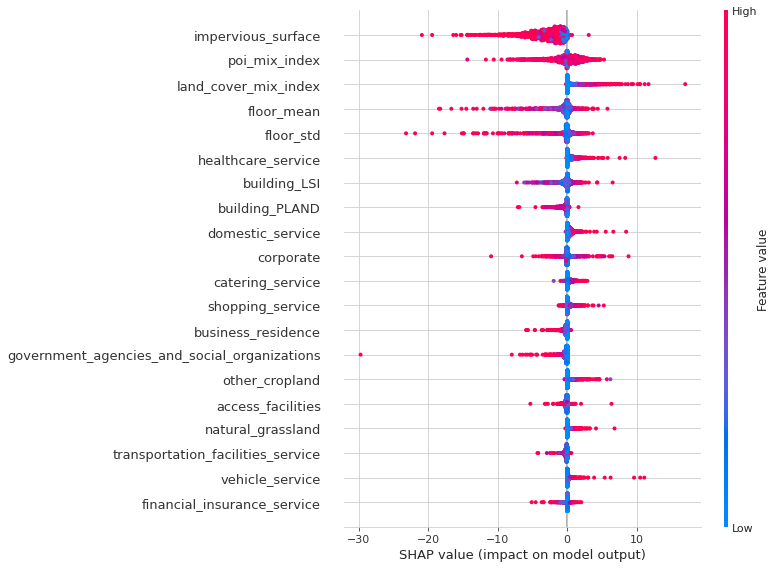

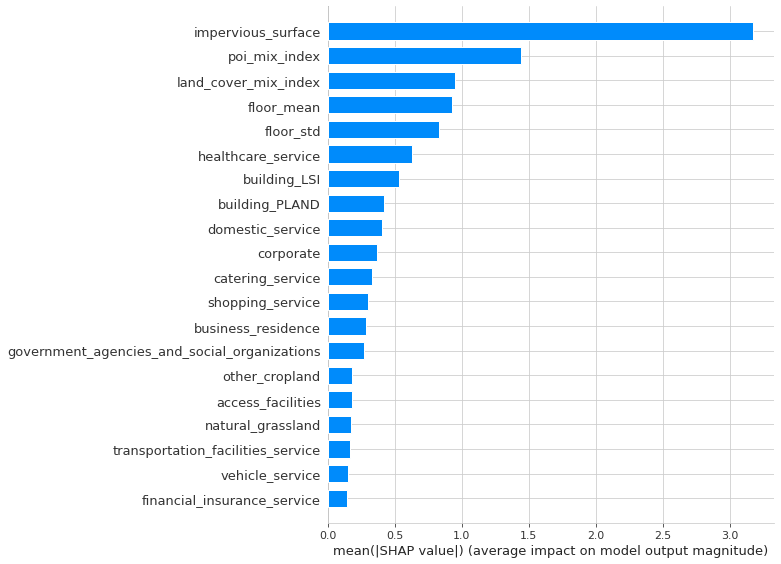

In [ ]:
shap.summary_plot(feature_igs[3], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(feature_igs[3], X.columns, plot_type="bar")

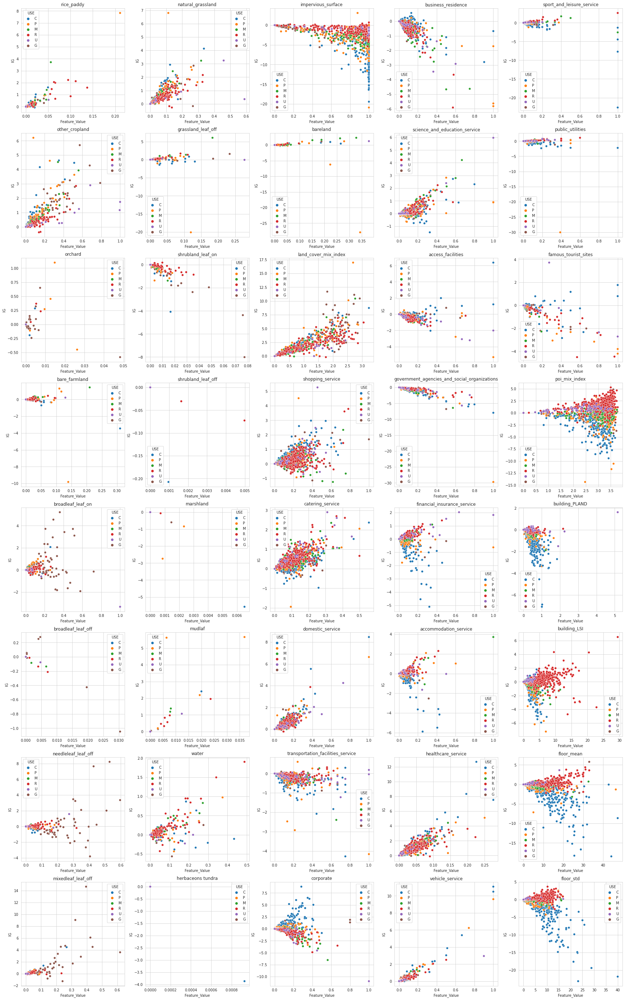

In [ ]:
fig, ax = plt.subplots(8, 5, figsize=(30,50))
for i, name in enumerate(feature_names):
  display_feature_importance = {'IG': [], 'Feature_Value': [], 'USE': []}
  display_feature_importance['IG'] += list(feature_igs[3][:, i])
  display_feature_importance['Feature_Value'] += list(X[name])
  display_feature_importance['USE'] += list(labels.loc[list(node_idx)])
  sns.scatterplot(data=display_feature_importance, y='IG', x='Feature_Value', hue='USE', ax=ax[i % 8][i // 8])
  ax[i % 8][i // 8].set_title(name)

居住用地

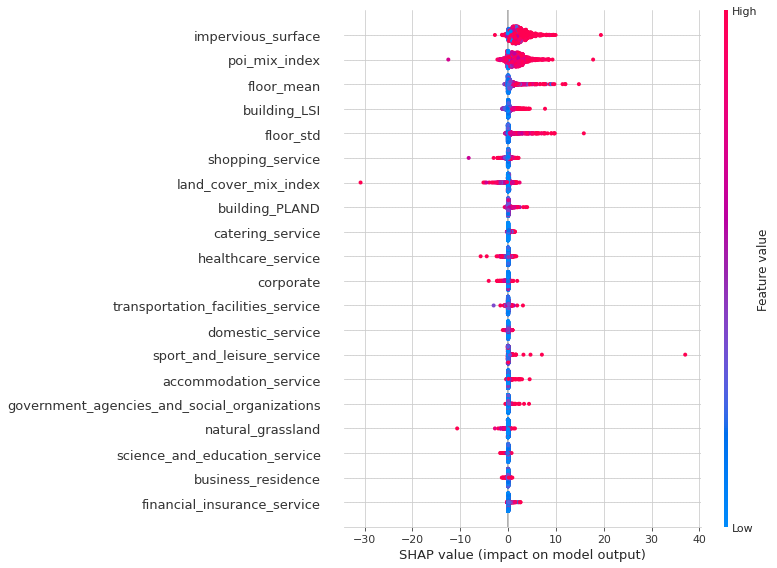

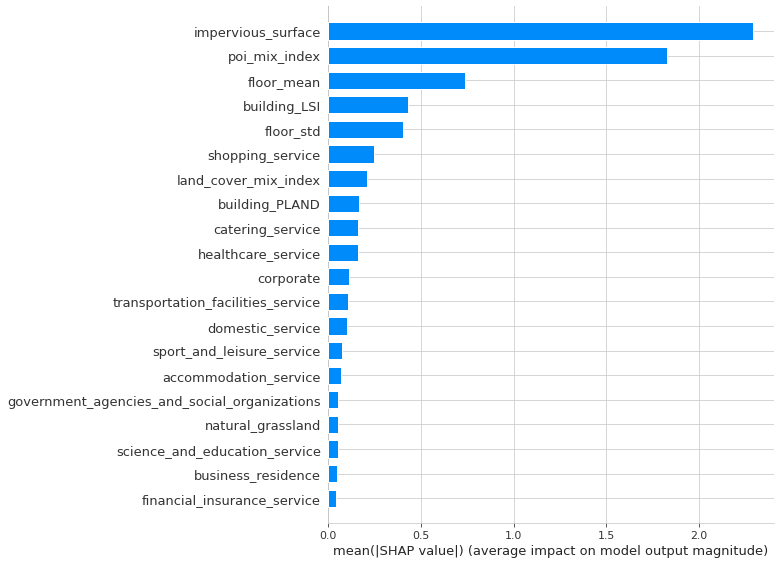

In [ ]:
shap.summary_plot(feature_igs[4], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(feature_igs[4], X.columns, plot_type="bar")

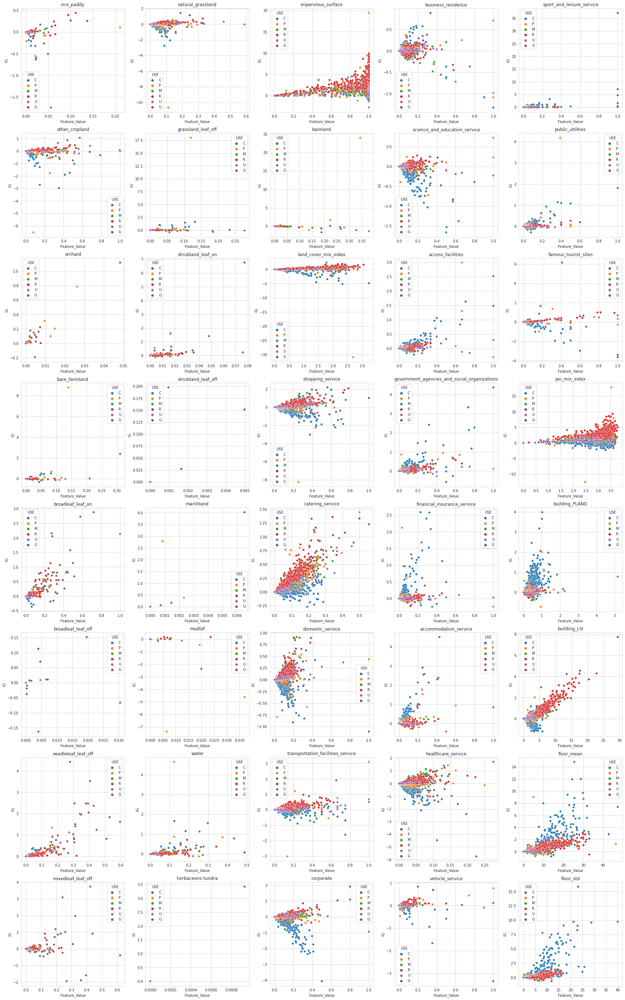

In [ ]:
fig, ax = plt.subplots(8, 5, figsize=(30,50))
for i, name in enumerate(feature_names):
  display_feature_importance = {'IG': [], 'Feature_Value': [], 'USE': []}
  display_feature_importance['IG'] += list(feature_igs[4][:, i])
  display_feature_importance['Feature_Value'] += list(X[name])
  display_feature_importance['USE'] += list(labels.loc[list(node_idx)])
  sns.scatterplot(data=display_feature_importance, y='IG', x='Feature_Value', hue='USE', ax=ax[i % 8][i // 8])
  ax[i % 8][i // 8].set_title(name)

市政公共设施用地：

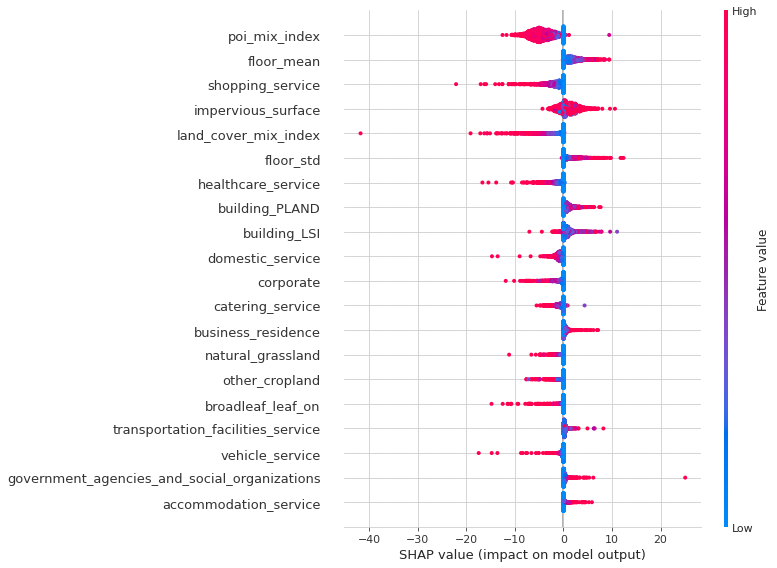

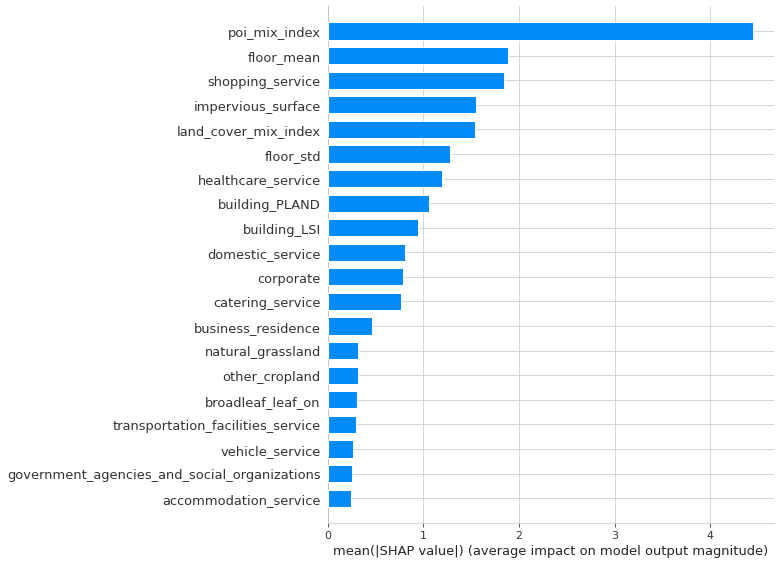

In [ ]:
shap.summary_plot(feature_igs[5], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(feature_igs[5], X.columns, plot_type="bar")

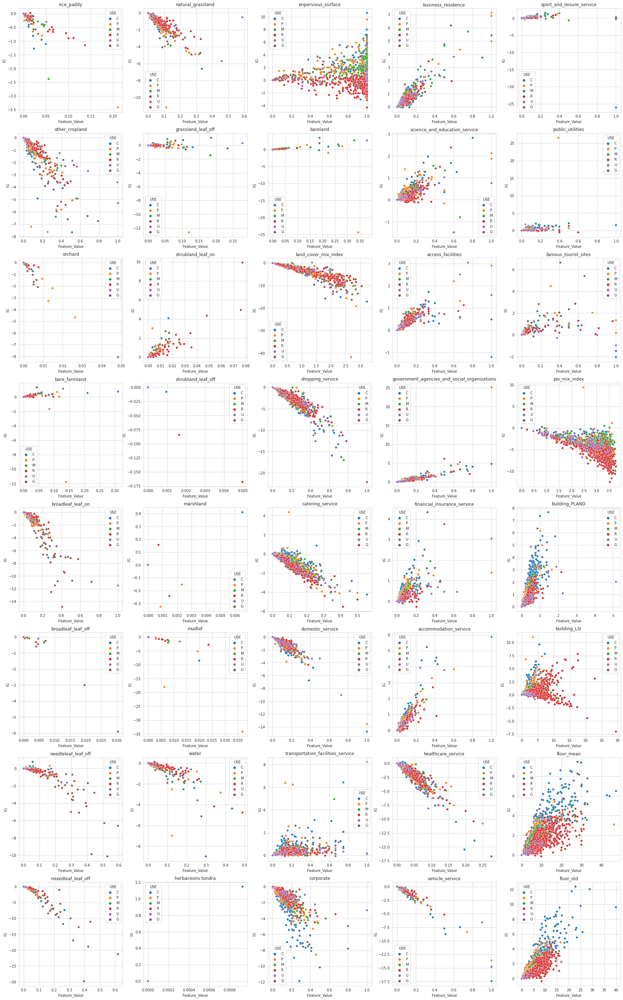

In [ ]:
fig, ax = plt.subplots(8, 5, figsize=(30,50))
for i, name in enumerate(feature_names):
  display_feature_importance = {'IG': [], 'Feature_Value': [], 'USE': []}
  display_feature_importance['IG'] += list(feature_igs[5][:, i])
  display_feature_importance['Feature_Value'] += list(X[name])
  display_feature_importance['USE'] += list(labels.loc[list(node_idx)])
  sns.scatterplot(data=display_feature_importance, y='IG', x='Feature_Value', hue='USE', ax=ax[i % 8][i // 8])
  ax[i % 8][i // 8].set_title(name)

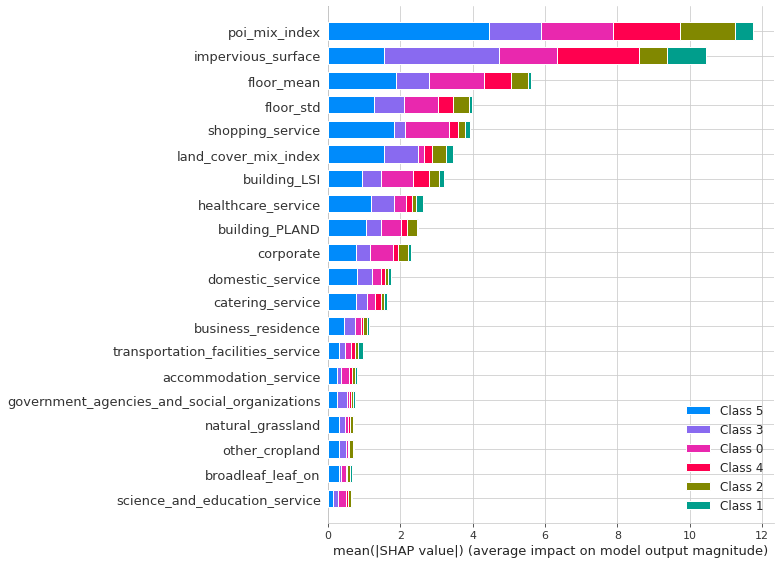

In [ ]:
shap.summary_plot(shap_values=[feature_igs[i] for i in range(6)], features=X.columns, plot_type='bar')

# (C1 x C2 x C)

(2) (C1 x C2 x C)分类过程中，对于C1类别中的目标节点，C2类别中的节点对其c类概率计算产生的影响

正负值均值

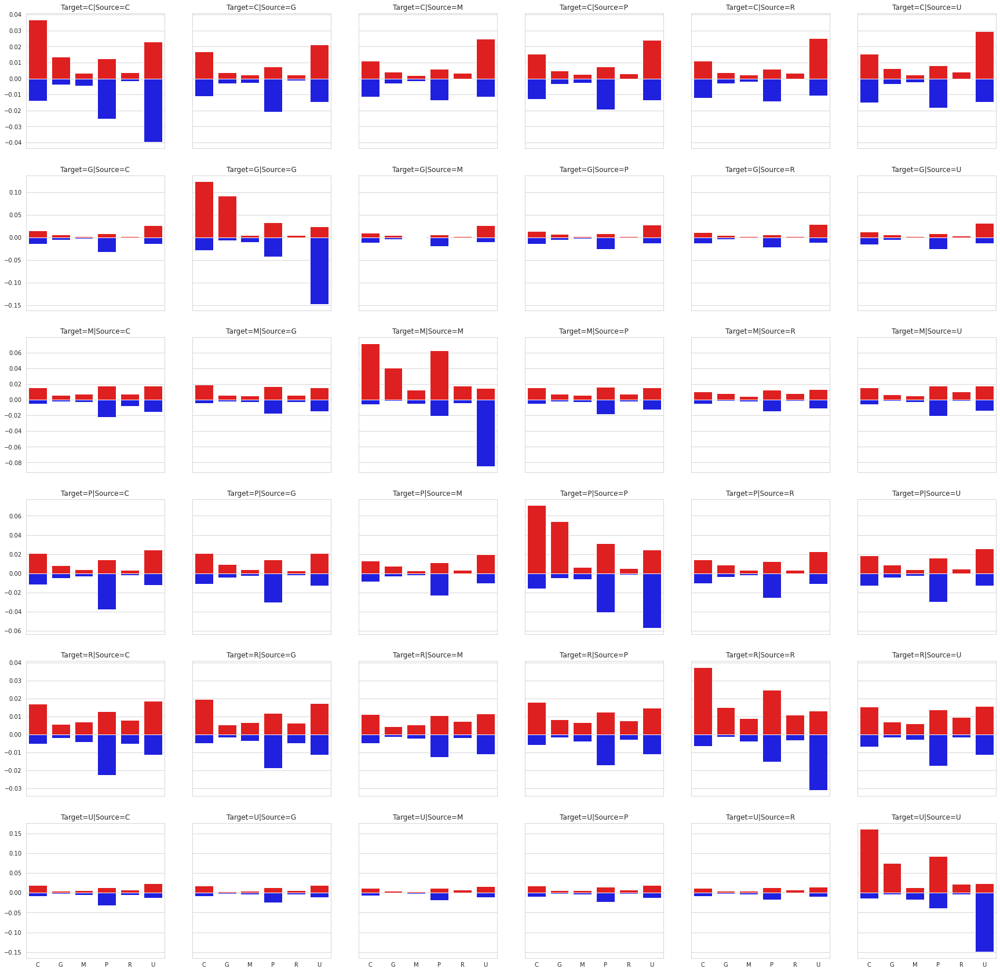

In [ ]:
classes = ['C', 'G', 'M', 'P', 'R', 'U']
fig, ax = plt.subplots(6, 6, sharex='col', sharey='row', figsize=(30,30))
for i, c1 in enumerate(c_idx):
  for j, c2 in enumerate(c_idx):
    sub_node_igs = [node_igs[c1][:, :, c2][:, c, :] for c in range(6)]
    pos_node_importance = [a[a > 0].mean() for a in sub_node_igs]
    neg_node_importance = [a[a < 0].mean() for a in sub_node_igs]
    # class_list = np.concatenate([[i] * (len(c1) * len(c2)) for i in classes])
    class_list = classes
    sns.barplot(data={'USE': class_list, 'VALUE': pos_node_importance}, y='VALUE', x='USE', ax=ax[i][j], color='red')
    sns.barplot(data={'USE': class_list, 'VALUE': neg_node_importance}, y='VALUE', x='USE', ax=ax[i][j], color='blue')
    ax[i][j].set_title(f'Target={classes[i]}|Source={classes[j]}')

正负值数量

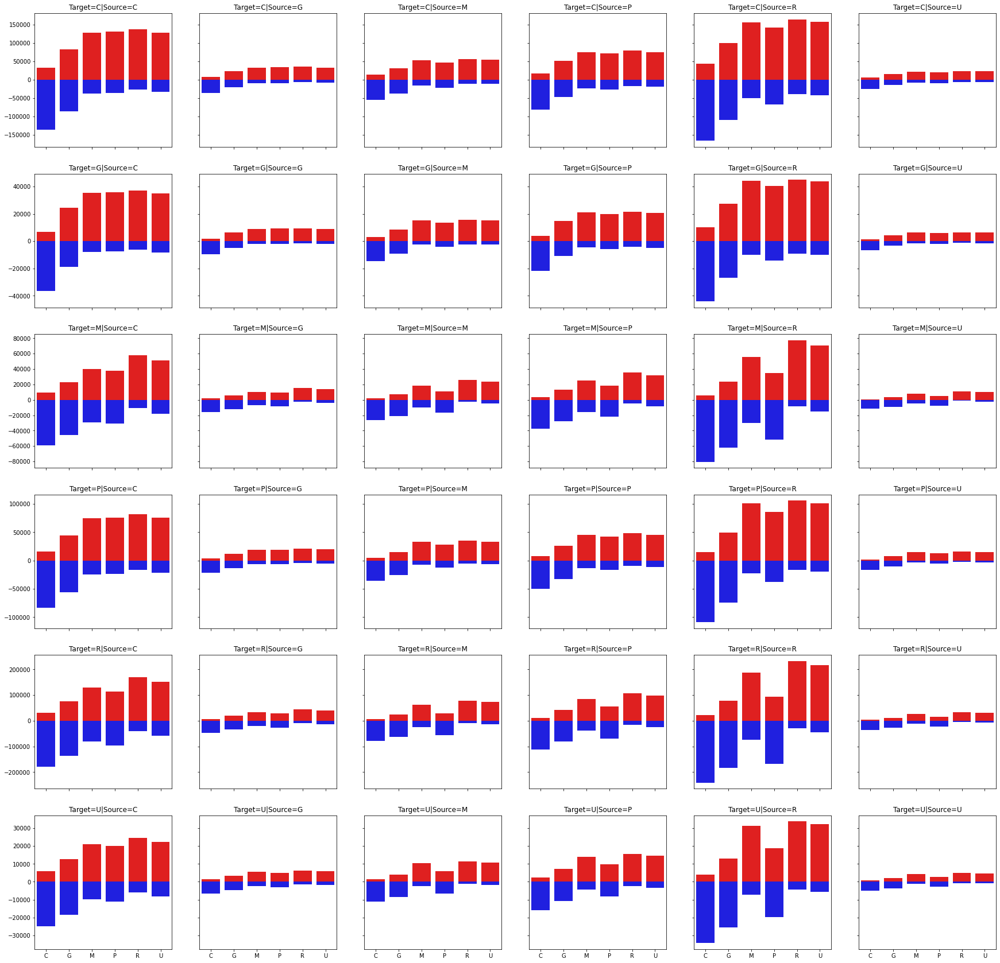

In [ ]:
classes = ['C', 'G', 'M', 'P', 'R', 'U']
fig, ax = plt.subplots(6, 6, sharex='col', sharey='row', figsize=(30,30))
for i, c1 in enumerate(c_idx):
  for j, c2 in enumerate(c_idx):
    sub_node_igs = [node_igs[c1][:, :, c2][:, c, :] for c in range(6)]
    pos_node_importance = [len(a[a > 0]) for a in sub_node_igs]
    neg_node_importance = [-len(a[a < 0]) for a in sub_node_igs]
    # class_list = np.concatenate([[i] * (len(c1) * len(c2)) for i in classes])
    class_list = classes
    sns.barplot(data={'USE': class_list, 'VALUE': pos_node_importance}, y='VALUE', x='USE', ax=ax[i][j], color='red')
    sns.barplot(data={'USE': class_list, 'VALUE': neg_node_importance}, y='VALUE', x='USE', ax=ax[i][j], color='blue')
    ax[i][j].set_title(f'Target={classes[i]}|Source={classes[j]}')

散点分布

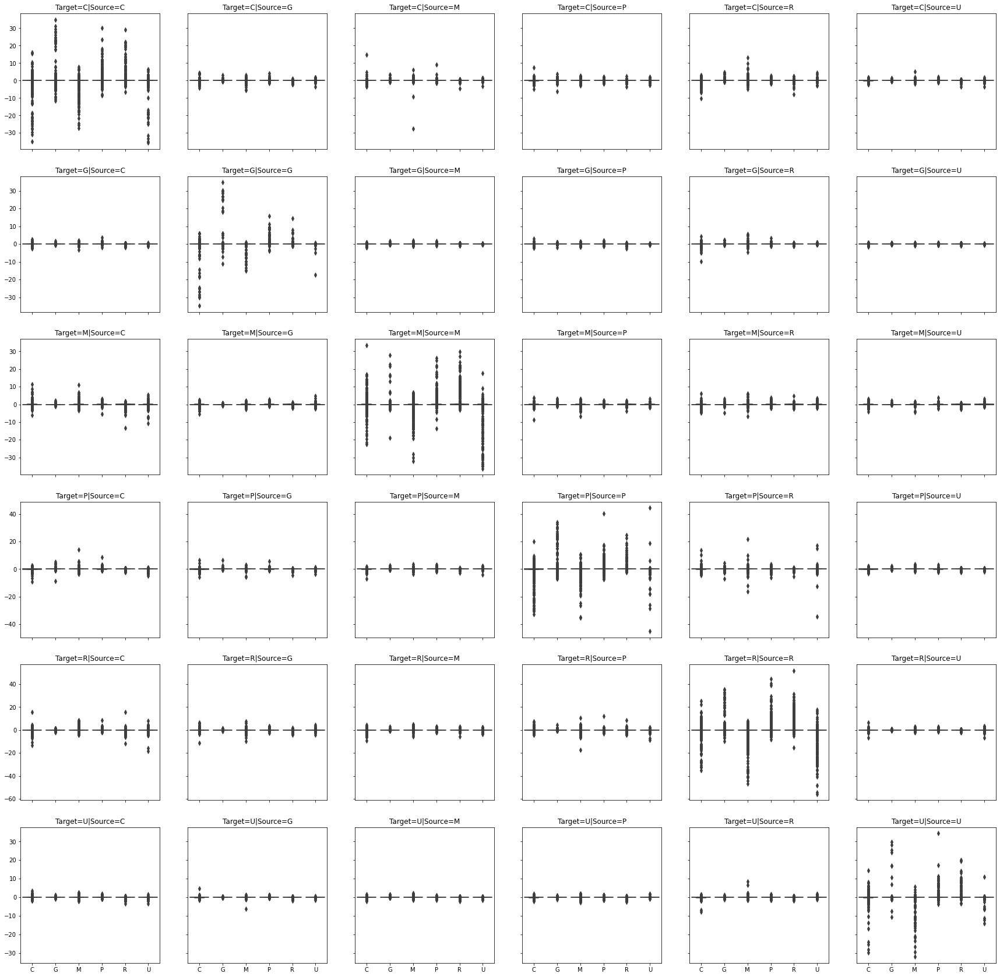

In [ ]:
classes = ['C', 'G', 'M', 'P', 'R', 'U']
fig, ax = plt.subplots(6, 6, sharex='col', sharey='row', figsize=(30,30))
for i, c1 in enumerate(c_idx):
  for j, c2 in enumerate(c_idx):
    sub_node_igs = [node_igs[c1][:, :, c2][:, c, :] for c in range(6)]
    node_importance = np.concatenate([s.flatten() for s in sub_node_igs])
    class_list = np.concatenate([[i] * (len(c1) * len(c2)) for i in classes])
    sns.boxplot(data={'USE': class_list, 'VALUE': node_importance}, y='VALUE', x='USE', ax=ax[i][j])
    ax[i][j].set_title(f'Target={classes[i]}|Source={classes[j]}')

# (Diag(N x N') x F x C)

(3) (Diag(N x N') x F x C) 在目标节点的分类中，目标节点自身的特征对于第c类别概率的影响

商业与服务业用地：

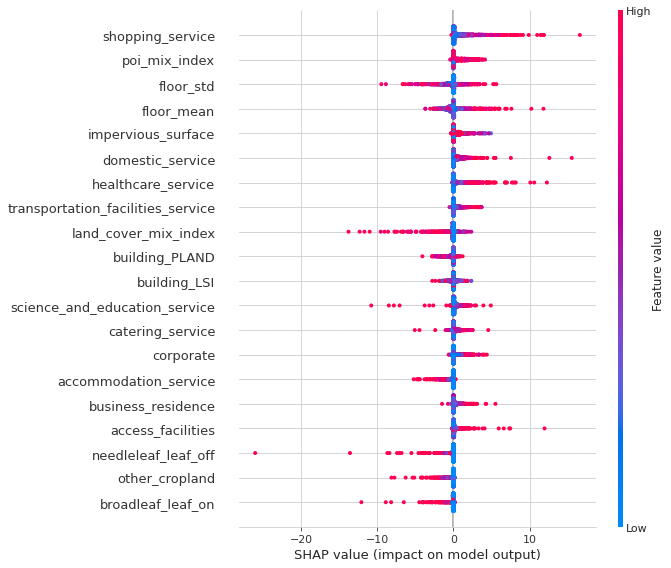

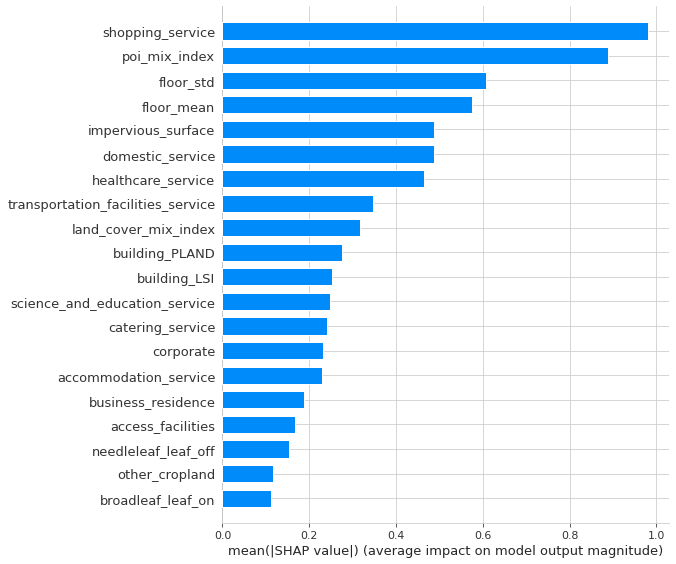

In [ ]:
shap.summary_plot(self_igs[0], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(self_igs[0], X.columns, plot_type="bar")
# shap.summary_plot(feature_igs[0]-self_igs[:,0,:], X)

绿地和广场：

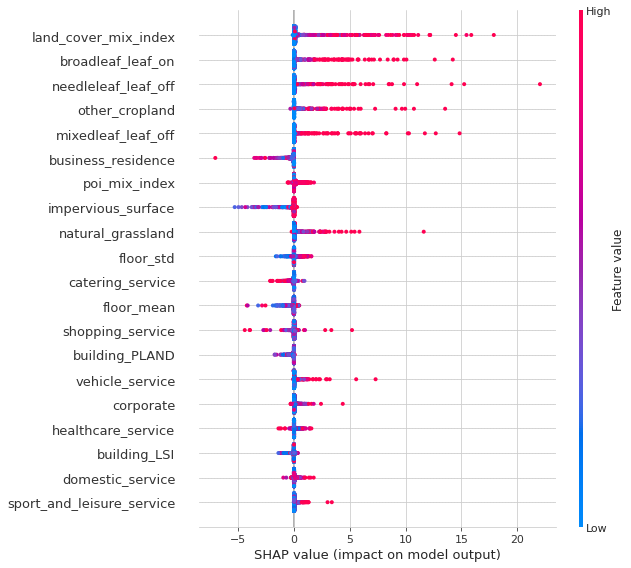

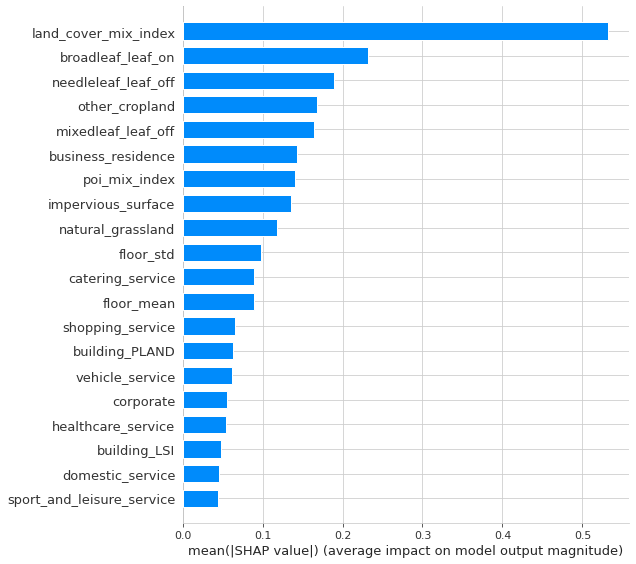

In [ ]:
shap.summary_plot(self_igs[1], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(self_igs[1], X.columns, plot_type="bar")

工业用地

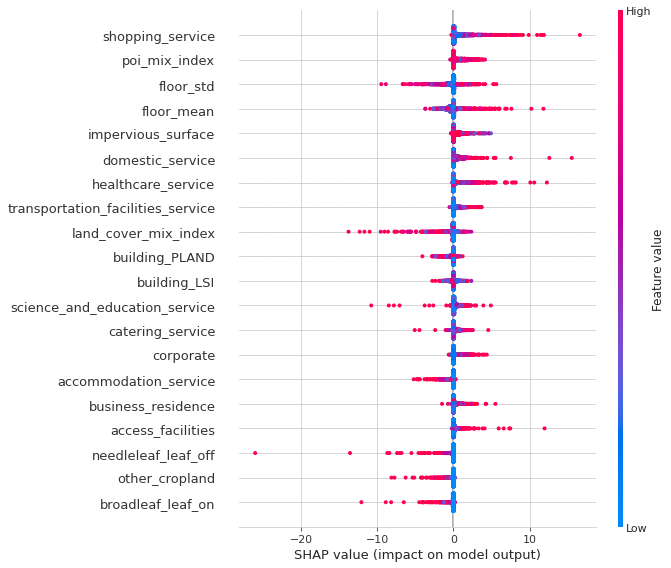

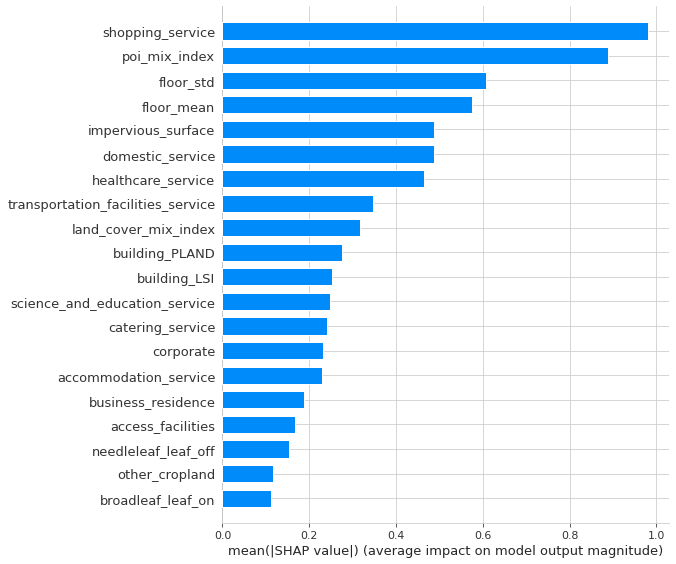

In [ ]:
shap.summary_plot(self_igs[0], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(self_igs[0], X.columns, plot_type="bar")

公共管理与服务用地

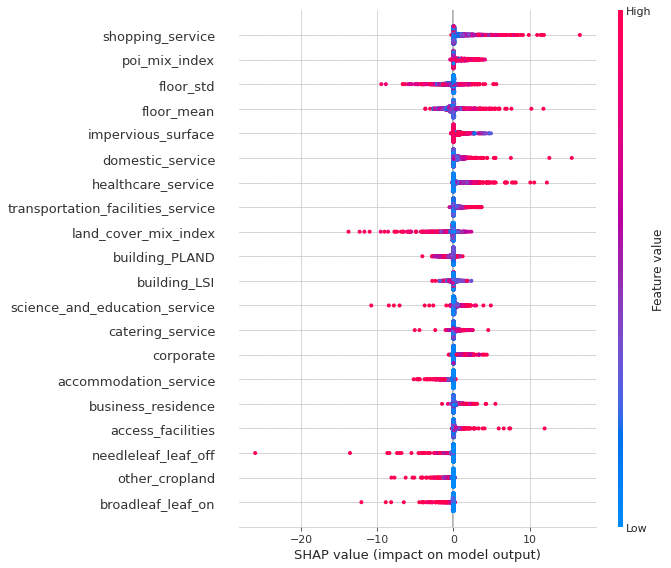

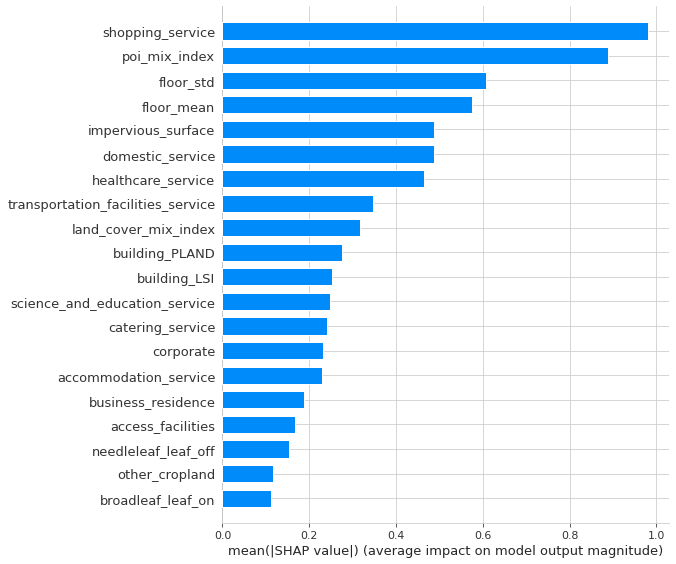

In [ ]:
shap.summary_plot(self_igs[0], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(self_igs[0], X.columns, plot_type="bar")

居住用地

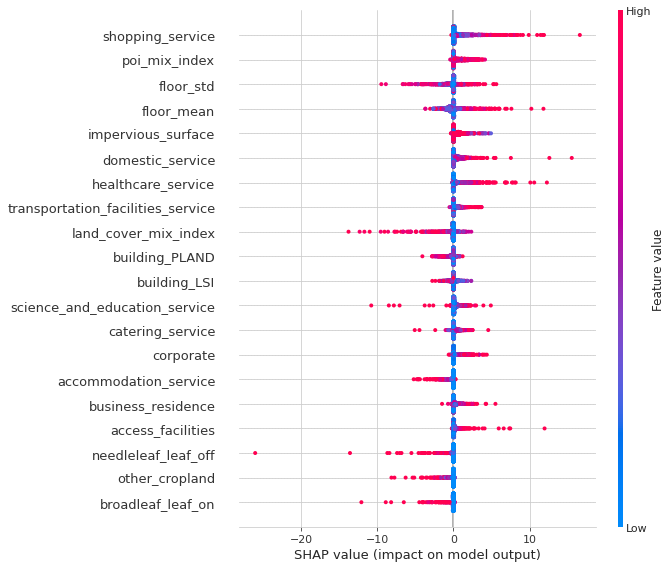

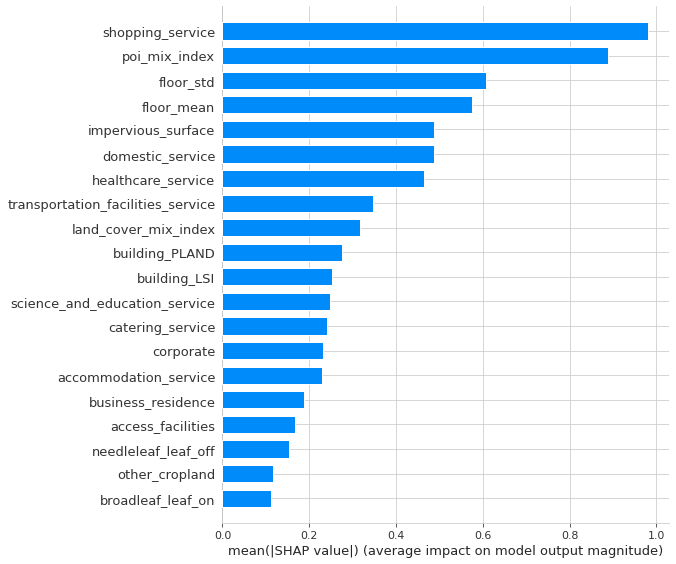

In [ ]:
shap.summary_plot(self_igs[0], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(self_igs[0], X.columns, plot_type="bar")

市政公共设施用地

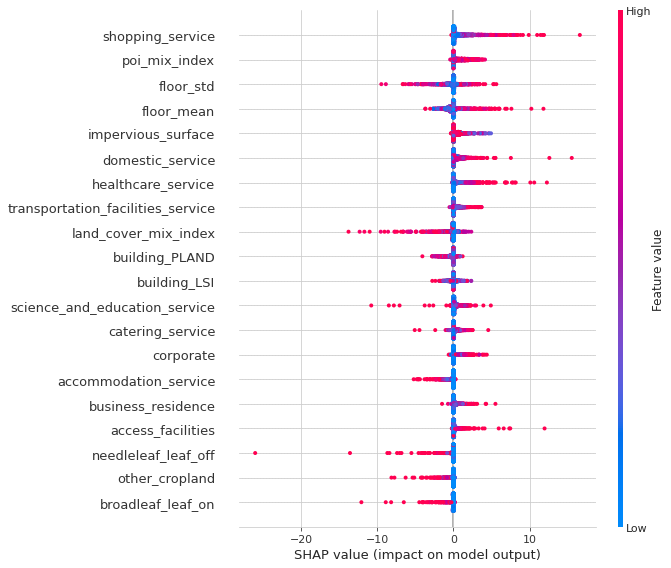

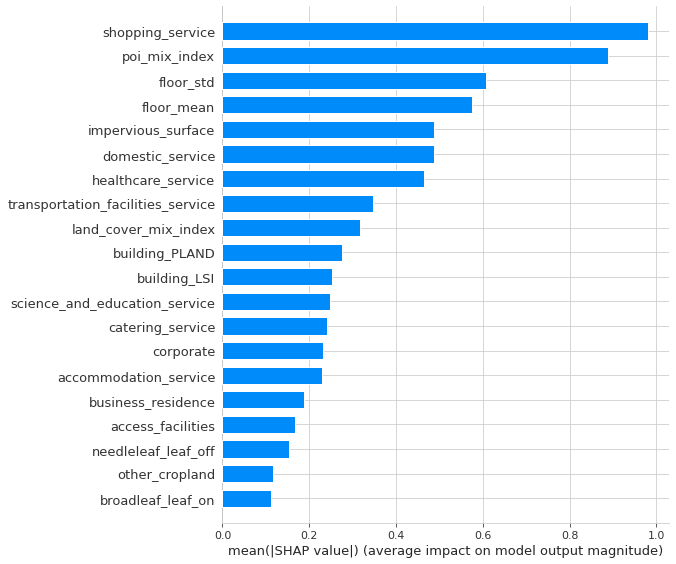

In [ ]:
shap.summary_plot(self_igs[0], X)
# shap.summary_plot(shap_values[0], train_X)
shap.summary_plot(self_igs[0], X.columns, plot_type="bar")

# (C1 x Flat(C1 x C2) x C x G)

(4) (C1 x Flat(C1 x C2) x C x G) 在网络g中，对于C1类别中的目标节点，类型为e(36类)的边对于其c类概率计算的影响
加入边权重

In [ ]:
link_classes = np.array([[f'{j}-{i}' for i in classes] for j in classes]).flatten()

首先统计对于所有节点，在各个分类中，每个网络中各类边的ig值之和的分布

商业与服务业用地：

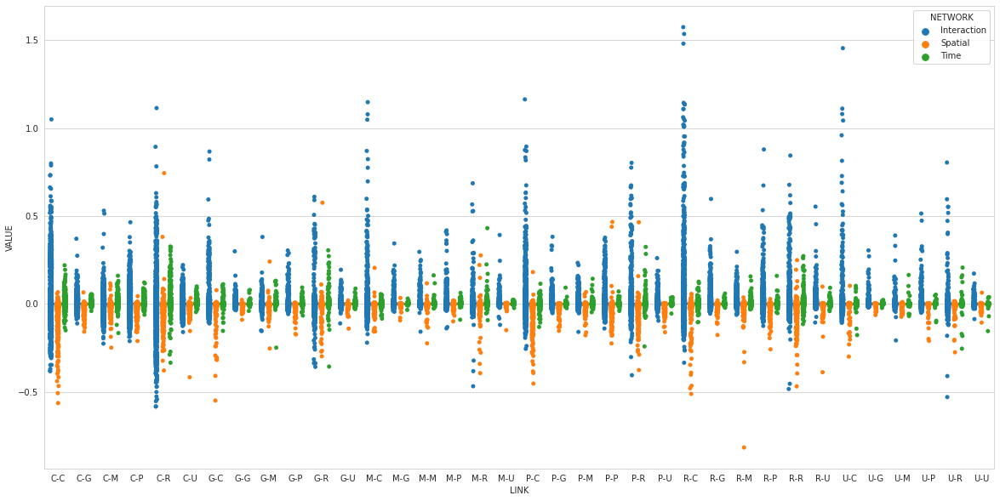

In [ ]:
sns.set_style('whitegrid')
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[:, 0, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * num_nodes), NETWORK=np.concatenate([[i] * (len(link_classes) * num_nodes) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

总体上交互网络和时序相似网络提供较大的正面影响而空间相似网络主要呈现负面影响，表示商业区的分类与空间上的相近并不存在直接关联；

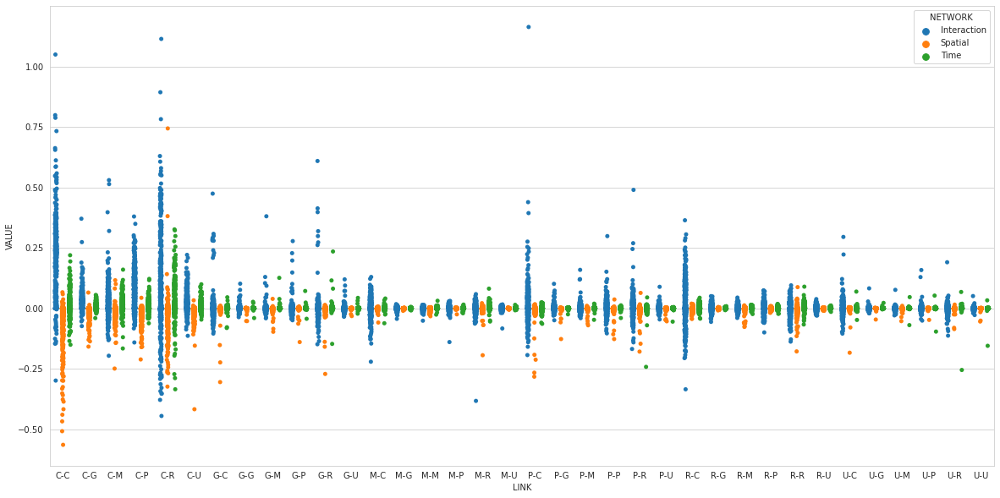

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[c_idx[0], 0, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * len(c_idx[0])), NETWORK=np.concatenate([[i] * (len(link_classes) * len(c_idx[0])) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

绿地与广场：

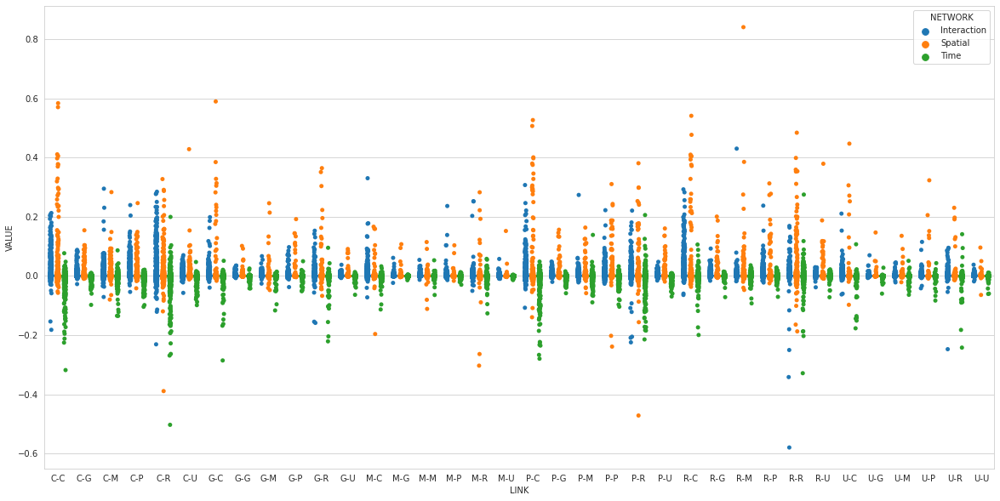

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[:, 1, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * num_nodes), NETWORK=np.concatenate([[i] * (len(link_classes) * num_nodes) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

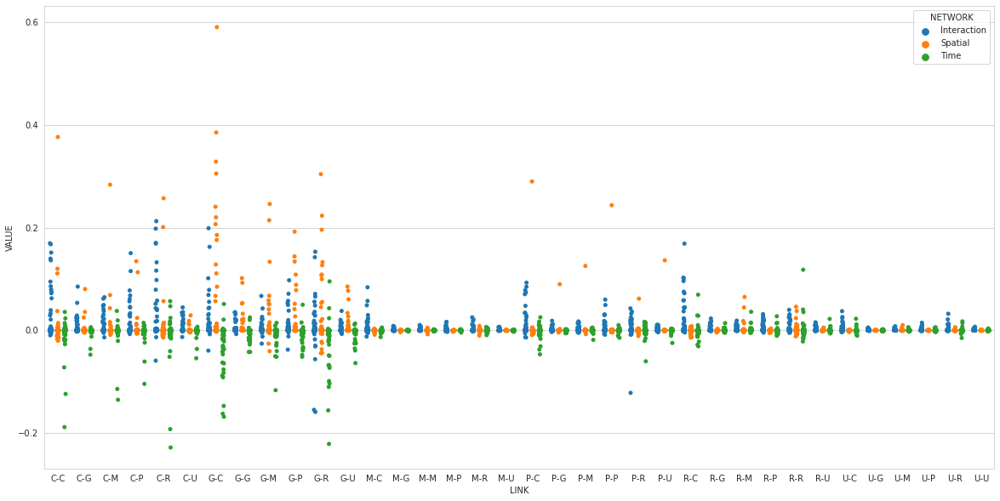

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[c_idx[1], 1, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * len(c_idx[1])), NETWORK=np.concatenate([[i] * (len(link_classes) * len(c_idx[1])) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

工业用地：

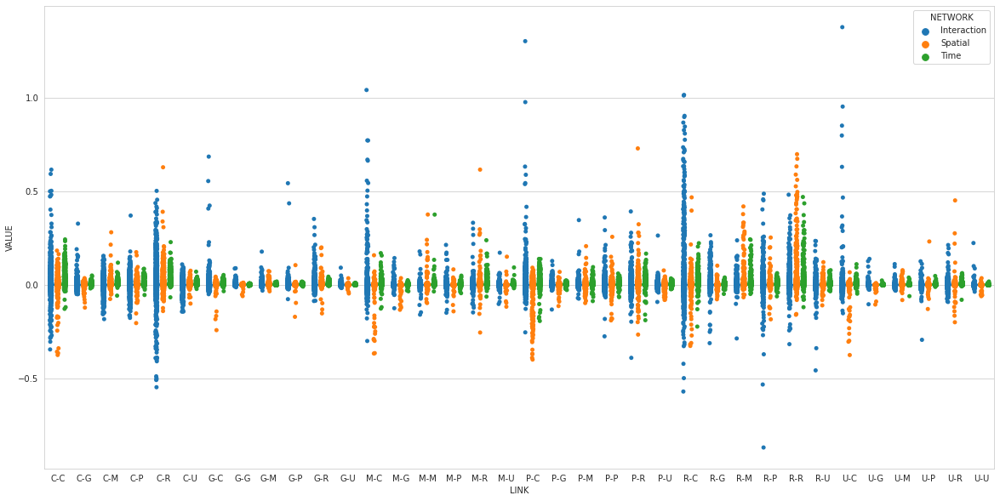

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[:, 2, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * num_nodes), NETWORK=np.concatenate([[i] * (len(link_classes) * num_nodes) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

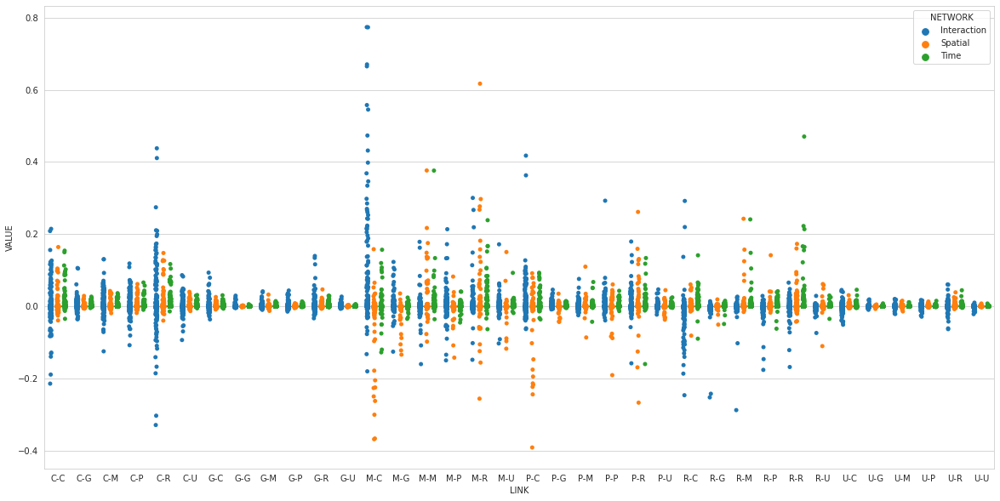

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[c_idx[2], 2, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * len(c_idx[2])), NETWORK=np.concatenate([[i] * (len(link_classes) * len(c_idx[2])) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

公共管理与服务用地：

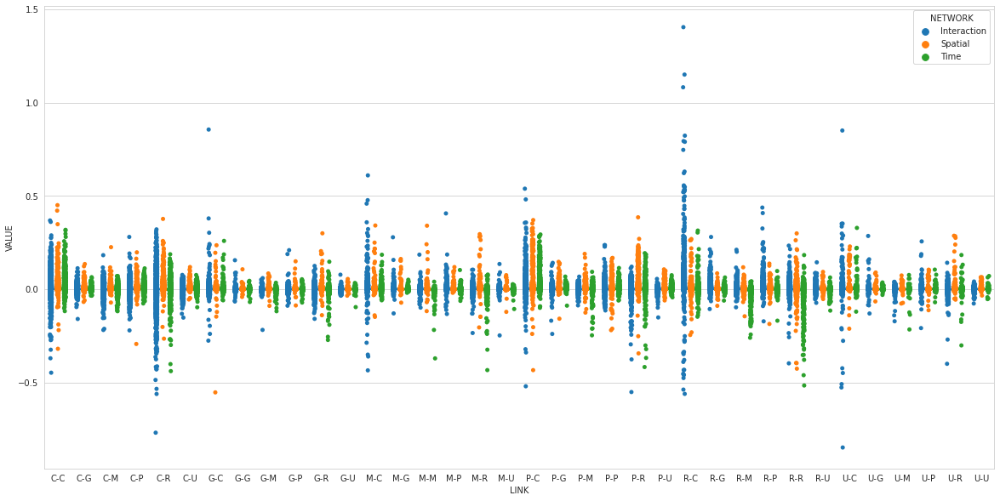

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[:, 3, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * num_nodes), NETWORK=np.concatenate([[i] * (len(link_classes) * num_nodes) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

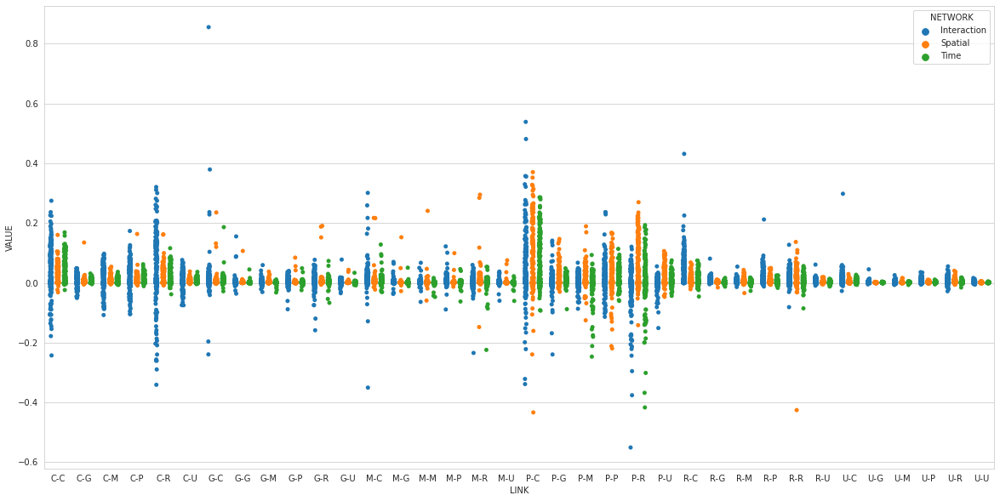

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[c_idx[3], 3, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * len(c_idx[3])), NETWORK=np.concatenate([[i] * (len(link_classes) * len(c_idx[3])) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

居住用地

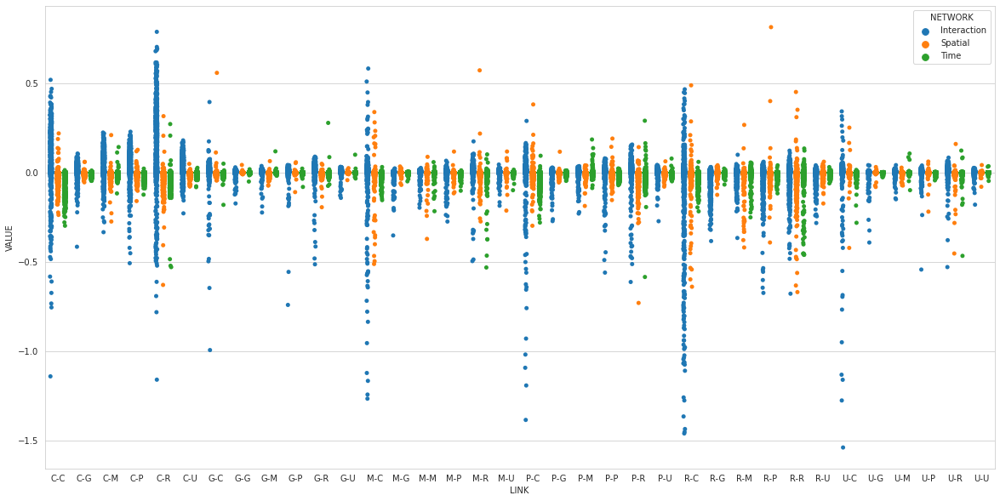

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[:, 4, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * num_nodes), NETWORK=np.concatenate([[i] * (len(link_classes) * num_nodes) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

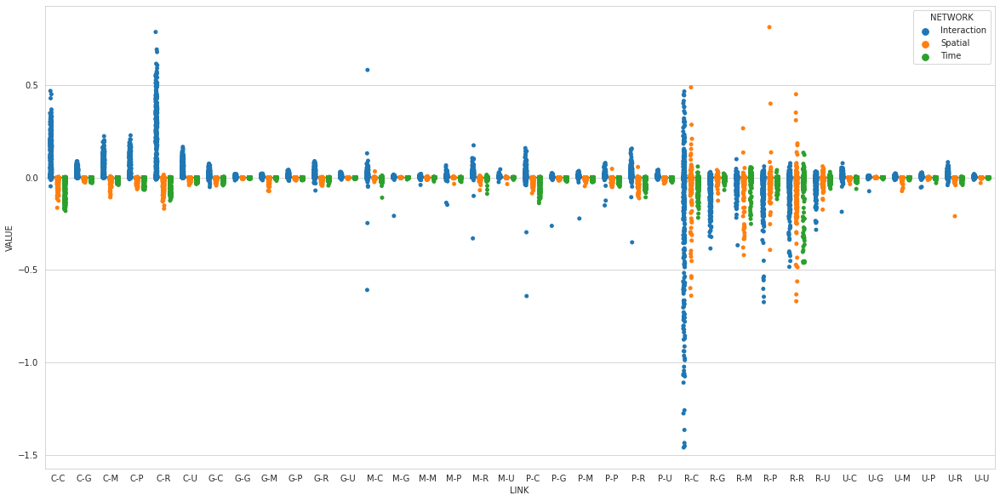

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[c_idx[4], 4, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * len(c_idx[4])), NETWORK=np.concatenate([[i] * (len(link_classes) * len(c_idx[4])) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

市政公共设施用地：

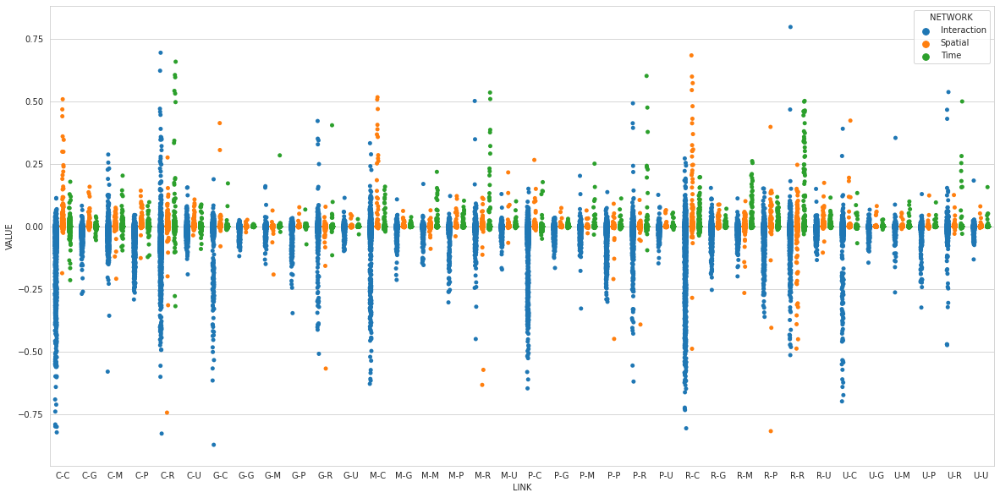

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[:, 5, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * num_nodes), NETWORK=np.concatenate([[i] * (len(link_classes) * num_nodes) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)

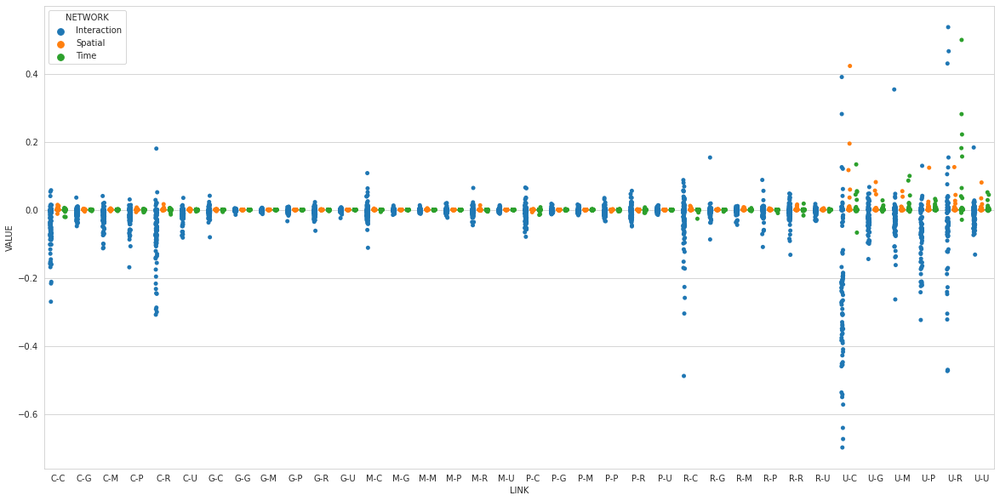

In [ ]:
f, ax = plt.subplots(figsize=(20, 10))
display_link_igs = pd.DataFrame(dict(VALUE=np.concatenate([link_igs[c_idx[5], 5, :, i, 1].flatten() for i in range(3)]), LINK=list(link_classes) * (3 * len(c_idx[5])), NETWORK=np.concatenate([[i] * (len(link_classes) * len(c_idx[5])) for i in ['Interaction', 'Spatial', 'Time']])))
ax = sns.stripplot(data=display_link_igs, y='VALUE', x='LINK', hue='NETWORK', dodge=True)